# MiMoSA Sample Workflow — Step 0: Importing Libraries

**Microbial Motion, Segmentation and Analysis**  
*A Python framework for microbial motion segmentation, tracking, and analysis.*

MiMoSA is based on upstream RABiTPy and substantially extends its tracking and analysis capabilities.

> **Python compatibility:** This workflow has been tested only with CPython 3.10.11. Other Python versions have not been tested, and compatibility with them is not claimed.

In [121]:
# Importing all the necessary modules from the package
from MiMoSA import Capture, Identify, Stats, Tracker

# Importing all the necessary constants
from MiMoSA.constants import AvailableOperations, AvailableProps, PropsThreshold 

#Other Imports
from IPython.display import display
from pathlib import Path

# Cell strain included in every exported statistics dataframe
cell_strain = "Strain_A" # Define cell strain

# Matplotlib settings for better visualization
# Faster, static
%matplotlib inline

# Slower, allows zoom, keeps plots in memory
#%matplotlib widget


# Step 1: Capture

## Step 1.1: Capture Dir

In [122]:
# Initialize the capture object
capture = Capture("./") # If no folder is specified it will create a folder at the root dir


Frames can be created from a loaded video, for higher quality (but larger file size), use raw frames.
We use Nikon microscopes so we process out the frames from the .ND2 file directly using FiJi/ImageJ and also obtain the FPS_Details using the included FiJi macro (Export_ND2_Metadata.groovy) in the tools folder.

## Step 1.2: Video File Path

In [ ]:
# Load video file to process frames out
load_video = False

if load_video:
    # Capture from video
    capture.load_video('./01_Inputs/01_Video/01_Sample_Video.mp4') # Set the path to the video file you want to process

else:
    print("Not loading video file.")


Not loading video file.


## Step 1.3: Create/Load Frames

In [125]:
# Create or Load Frames
create_frames = False
load_frames = True # Load frames if not creating

# Load fps metadata workbook
load_metadata = True

if load_metadata:
    # Load the capture speed and spatial-scale details from the ND2 metadata workbook
    capture_properties = capture.load_capture_properties_from_file(
        "./01_Inputs/FPS_Details.xlsx"
        )
    capture_speed_in_fps = capture_properties["capture_speed_in_fps"]
    pixel_scale_factor = capture_properties["pixel_scale_factor"]
    scale_units = capture_properties["scale_units"]
    expected_frame_count = capture_properties["frames"]
    frame_resolution = capture_properties["resolution"]
    timestamp_first_frame = capture_properties["timestamp_first_frame"]
    timestamp_last_frame = capture_properties["timestamp_last_frame"]
else:
    # Manually input the required metadata
    capture_speed_in_fps = 28.279
    pixel_scale_factor = 0.16
    scale_units = 'um'

if create_frames:
    # Process video into frames and store them in a directory named 'frames'
    frames = capture.process_video_into_frames(
        capture_speed_in_fps=capture_speed_in_fps,
        pixel_scale_factor=pixel_scale_factor,
        scale_units=scale_units,
        is_store_video_frames=True,
        store_images_path="./01_Inputs/01_MiMoSA_Frames")
elif load_frames:
    frames = capture.load_images_as_frames(
        "./01_Inputs/02_ND2_Frames",
        capture_speed_in_fps=capture_speed_in_fps,
        pixel_scale_factor=pixel_scale_factor,
        scale_units=scale_units)
else:
    print("Not creating or loading frames.")


Loaded capture properties from 01_Inputs/FPS_Details.xlsx: 851 frames at 2044x2048, 28.27888911452496 FPS, pixel scale factor 0.1625 um, timestamps 0.5729871500001754-30.66610702304705.


Loading frames: 100%|██████████| 100/100 [00:00<00:00, 227.87it/s]

100 frames loaded from folder: ././01_Inputs/02_ND2_Frames


## Step 1.4: Select Working Frames

In [5]:
# Select the working frames range from the loaded frames for further processing
start_frame=1
end_frame=len(frames)

working_frames = capture.select_working_captured_frames(
    start_frame=start_frame,
    end_frame=end_frame,
    frame_indexing="one_based", # zero_based or one_based
    end_inclusive=True
    )


Selected 100 working captured frames from 1 through 100 (one_based).


# Step 2: Identify

## 2.0: Initialize "identify" object

In [6]:
# Initialize the identify object with the capture object
identify = Identify(capture_frame_object=capture)


## 2.1: Show Frames

### 2.1.1: Working Frames

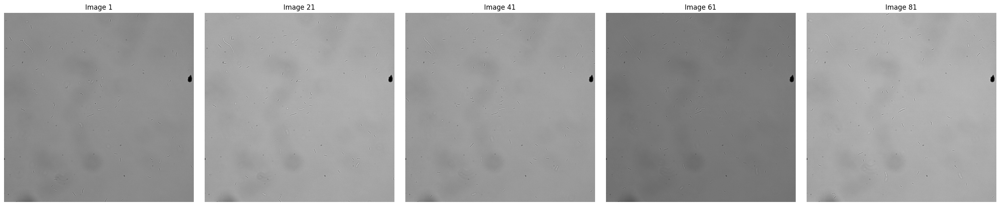

In [7]:
# Display frames from the working range
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count

identify.show_working_frames(
    images_to_show_count=images_to_show_count,
    images_per_row=images_per_row,
    use_gray_cmap=True
    )


### 2.1.2: Display ALL Frames

In [8]:
# Display all frames (not just working_frames)
show_all = False
images_to_show_count = len(frames) # Will fail if too large
images_per_row = 5 if len(frames) > 5 else len(frames)

# Display after applying grayscale (or not)
if show_all:
    # Display all the captured frames; if too many, it will fail
    identify.show_all_frames(
        images_to_show_count=images_to_show_count,
        images_per_row=images_per_row,
        use_gray_cmap=True
        )
    

## 2.2: Load previously computed masks

### 2.2.1: Load Masks

In [9]:
# Load masks
load_masks = False # Load pre-computed masks
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count

if load_masks:
    # Re-initialize the identify object, useful if wanting to start fresh
    identify = Identify(capture_frame_object=capture)

    masks = identify.import_saved_masks(
        masks_store_path="./02_Outputs/01_Masks/04_Masks_Omnipose", # Set path to masks dir
        is_update_masks=True,
        import_as_binary=False # For Omnipose masks, keep: False
    )

    # Display frames after applying grayscale (or not) thresholding
    identify.show_working_masks(
        images_to_show_count=images_to_show_count,
        images_per_row=images_per_row,
        use_gray_cmap=False
        )
else:
    print("Not loading masks.")


Not loading masks.


### 2.2.2: Display ALL loaded masks

In [10]:
# Display all masks (not just working masks)
show_all = False

# Display after applying grayscale
if load_masks and show_all:
    images_to_show_count = len(masks)  # Will fail if too large
    images_per_row = 5 if len(masks) > 5 else len(masks)
    identify.show_all_masks(
        images_to_show_count=images_to_show_count,
        images_per_row=images_per_row,
        use_gray_cmap=False,
        )


## 2.3: Run Generic-Based Segmentation

### 2.3.0: Segmentation Flag:

In [11]:
# Run Generic-Based Segmentation
run_segmentation = True

if not load_masks: # Only run segmentation if masks are not loaded.
    if run_segmentation:
        print("Running segmentation blocks.")
    else:
        print("Not running segmentation blocks.")
elif load_masks and run_segmentation:
    run_segmentation = False
    print("load_masks is True, so skipping segmentation blocks.")


Running segmentation blocks.


### 2.3.1: Manual Thresholding:

Applying grayscale thresholding: 100%|██████████| 100/100 [00:00<00:00, 521.45it/s]


Masks saved successfully to path:  ././02_Outputs/01_Masks/01_Masks_Manual_Grayscale
Threshold applied successfully.


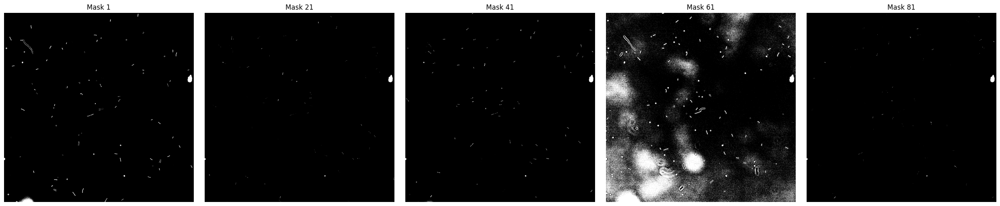

In [14]:
# Run manual thresholding
run_manual_thresholding = True
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count

if run_segmentation and not load_masks:
    if run_manual_thresholding:
        # Construct a second Identify instance from the same Capture object
        identify_manual_thresholding = Identify(capture_frame_object=capture) # This permits multiple segmentation versions available simultaneously

        # Apply manual grayscale thresholding onto working_frames
        identify_manual_thresholding.apply_grayscale_thresholding(
            threshold=0.45,
            object_polarity="dark_on_bright", # Use "bright_on_dark" bright cells/objects on dark background
            is_update_masks=True,
            save_masks=True,
            masks_store_path="./02_Outputs/01_Masks/01_Masks_Manual_Grayscale"
            )
        
        identify_manual_thresholding.show_working_masks(
            images_to_show_count=images_to_show_count,
            images_per_row=images_per_row,
            use_gray_cmap=True
            )


### 2.3.2: Algorithm-Based Thresholding

#### 2.3.2.1: Try all algorithms

Following thresholding algorithms are applied: 'isodata', 'li', 'mean', 'minimum', 'otsu', 'triangle', 'yen'


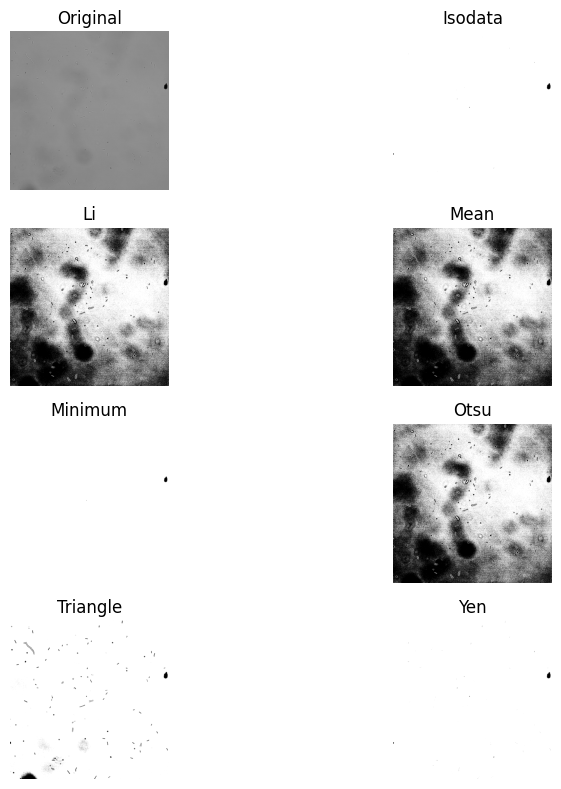

In [15]:
# Run algorithm thresholding
# The following algorithms are available: 'isodata', 'li', 'mean', 'minimum', 'otsu', 'triangle', 'yen'
run_algorithm_thresholding = True

if run_segmentation and not load_masks:
    if run_algorithm_thresholding:
        # Construct a second Identify instance from the same Capture object
        identify_algorithm_thresholding = Identify(capture_frame_object=capture) # This permits multiple segmentation versions available simultaneously

        # Try algorithm based thresholding
        identify_algorithm_thresholding.try_all_algorithm_based_thresholding(frame_index=0)


#### 2.3.2.2: Selected Algorithm

Applying algorithm-based thresholding: 100%|██████████| 100/100 [00:01<00:00, 55.97it/s]


Masks saved successfully to path:  ././02_Outputs/01_Masks/02_Masks_triangle_Algorithm
Selected triangle Algorithm-based thresholding applied successfully.
NOTE: If dark objects are displayed over a light background, set 'is_color_inverse' to True and redo the thresholding to correct it before proceeding to the next step.


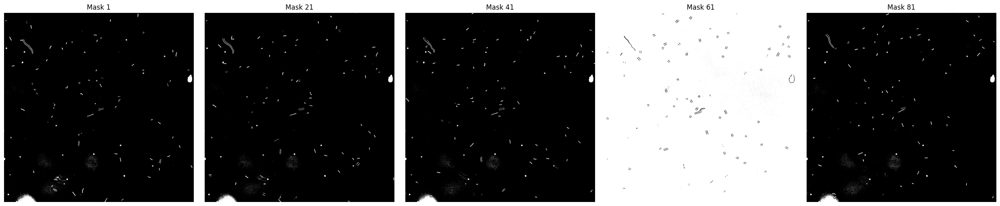

In [16]:
# Display Range
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count
algorithm="triangle" # The following algorithms are available: 'isodata', 'li', 'mean', 'minimum', 'otsu', 'triangle', 'yen'

# Run selected algorithm thresholding
if run_segmentation and not load_masks:
    if run_algorithm_thresholding:
        # Apply algorithm based thresholding
        identify_algorithm_thresholding.apply_algorithm_based_thresholding(
            algorithm=algorithm,
            is_color_inverse=True,
            is_update_masks=True,
            save_masks=True,
            masks_store_path=f"./02_Outputs/01_Masks/02_Masks_{algorithm}_Algorithm"
            )
        
        identify_algorithm_thresholding.show_working_masks(
            images_to_show_count=images_to_show_count,
            images_per_row=images_per_row,
            use_gray_cmap=True
            )


### 2.3.3: Adaptive Gaussian Thresholding

Applying Gaussian adaptive thresholding: 100%|██████████| 100/100 [00:01<00:00, 69.21it/s]


Masks saved successfully to path:  ././02_Outputs/01_Masks/03_Masks_Gaussian
Gaussian adaptive thresholding applied successfully.
NOTE: If dark objects are displayed over a light background, set 'is_color_inverse' to True and redo the thresholding to correct it before proceeding to the next step.


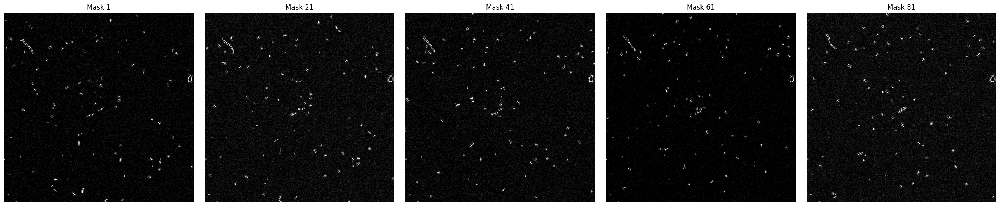

In [17]:
# Run adaptive thresholding
run_adaptive_thresholding = True
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count

if run_segmentation and not load_masks:
    if run_adaptive_thresholding:
        # Construct a second Identify instance from the same Capture object
        identify_adaptive_thresholding = Identify(capture_frame_object=capture) # This permits multiple segmentation versions available simultaneously

        # Apply algo based grayscale thresholding
        identify_adaptive_thresholding.apply_gaussian_adaptive_thresholding(
            block_size = 19, # Size of the local region (block) used to calculate the threshold for each pixel; must be an odd number.
            c = 7, # Constant subtracted from the mean or weighted mean of the local region, which helps in adjusting the threshold.
            is_color_inverse = True, # Set to `True` if the background is lighter than the objects and you need to invert the results.
            is_update_masks = True, # Set to `True` to update the working masks.
            save_masks=True,
            masks_store_path="./02_Outputs/01_Masks/03_Masks_Gaussian"
            )

        identify_adaptive_thresholding.show_working_masks(
            images_to_show_count=images_to_show_count,
            images_per_row=images_per_row,
            use_gray_cmap=True
            )


## 2.4: Omnipose Thresholding

### 2.4.0: Omnipose Flag

In [18]:
# Run omnipose thresholding
run_omnipose_thresholding = True


### 2.4.1: Display available models

In [19]:
# Display available omnipose models
if run_omnipose_thresholding and not load_masks:
    possible_models = identify.get_possible_omnipose_model_names()
    display(possible_models)
elif run_omnipose_thresholding and load_masks:
    run_omnipose_thresholding = False
    print("load_masks is True, so skipping Omnipose thresholding.")


['bact_phase_affinity',
 'bact_phase_omni',
 'bact_fluor_omni',
 'worm_omni',
 'worm_bact_omni',
 'worm_high_res_omni',
 'cyto2_omni',
 'plant_omni',
 'bact_phase_cp',
 'bact_fluor_cp',
 'plant_cp',
 'worm_cp',
 'cyto',
 'nuclei',
 'cyto2',
 'bact_brightfield']

### 2.4.2: Omnipose Test

#### 2.4.2.1: Initialize Capture and Identify Omnipose Test Objects

In [21]:
# Run Omnipose Test
run_omnipose_test = True

if run_omnipose_thresholding and run_omnipose_test:
    # Select the working frames from the loaded frames for further processing
    start_omnipose_test_frame=12
    end_omnipose_test_frame=12

    # Initialize the capture_omnipose_test object.
    capture_omnipose_test = Capture("./") # As implemented, a new capture object is required to have a separate working_frames range
    test_frames = capture_omnipose_test.load_images_as_frames(
        "./01_Inputs/02_ND2_Frames",
        capture_speed_in_fps=capture_speed_in_fps,
        pixel_scale_factor=pixel_scale_factor,
        scale_units=scale_units
        )
    
    working_omnipose_test_frames = capture_omnipose_test.select_working_captured_frames(
        start_frame=start_omnipose_test_frame,
        end_frame=end_omnipose_test_frame,
        frame_indexing="one_based", # zero_based or one_based
        end_inclusive=True
        )

    # Initialize the identify object with the new capture object
    identify_omnipose_test = Identify(capture_frame_object=capture_omnipose_test)


Loading frames: 100%|██████████| 100/100 [00:00<00:00, 625.94it/s]

100 frames loaded from folder: ././01_Inputs/02_ND2_Frames
Selected 1 working captured frames from 12 through 12 (one_based).


#### 2.4.2.2: Omnipose Test Settings

In [22]:
# Omnipose Test Settings
if run_omnipose_thresholding and run_omnipose_test:
    identify_omnipose_test.initialize_omnipose_model(
        model_name='bact_phase_affinity',
        use_gpu=True, # In case you don't want to use GPU, write 'use_gpu=False'.
        params = {
            'channels': None, # always define this with the model (for phase_omni model [0, 0])
            'omni': True, # we can turn off Omnipose mask reconstruction, not advised 
            
            'batch_size': 8, # larger batch size can speed up processing, but requires more GPU memory; smaller batch size uses less memory but may be slower
            'rescale': None, # upscale or downscale your images, None = no rescaling 
            'transparency': True, # transparency in flow output
            'cluster': False, # use DBSCAN clustering
            'resample': True, # whether or not to run dynamics on rescaled grid or original grid 
            'verbose': False, # turn on if you want to see more output 
            'tile': False, # average the outputs from flipped (augmented) images; slower, usually not needed 
            'niter': None, # default None lets Omnipose calculate # of Euler iterations (usually <20) but you can tune it for over/under segmentation 
            'augment': False, # Can optionally rotate the image and average network outputs, usually not needed 
            'affinity_seg': True,
            'invert': False,
            
            'diameter': None,
            'mask_threshold': -1, # erode or dilate masks with higher or lower values between -5 and 5 
            'flow_threshold': 0.4, # default is .4, but only needed if there are spurious masks to clean up; slows down output
            'min_size': 20,
            'max_size': 1500,
            }
        )

# Recommend running omnipose gui directly from terminal to test different parameter settings.


[distfit] >INFO> >>bact_phase_affinity<< model set to be used
[distfit] >INFO> Using GPU.
[distfit] >INFO> u-net config: ([1, 32, 64, 128, 256], 3, 2)


>>> GPU activated? (device(type='mps', index=0), True)


Preparing frames for the omnipose model: 100%|██████████| 1/1 [00:00<00:00, 18.55it/s]

Frames prepared successfully for the omnipose model.
Omnipose model initialized successfully.


#### 2.4.2.3: Run and Display Omnipose Test Segmentation

Segmenting images: 100%|██████████| 1/1 [00:03<00:00,  3.72s/it]

total segmentation time: 3.6996078491210938s
Batch 1 segmentation is complete
Objects segmented successfully using the omnipose model.


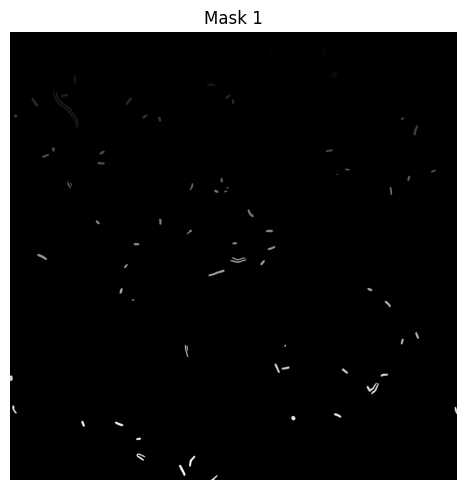

In [23]:
# Run Omnipose Test
if run_omnipose_thresholding and run_omnipose_test:
    # Set batch size for Omnipose processing
    batch_size = len(working_omnipose_test_frames) if len(working_omnipose_test_frames) < 100 else 100

    # Apply Omnipose model
    identify_omnipose_test.apply_omnipose_masking(
        batch_size=batch_size,
        save_masks=True, masks_store_path="./02_Outputs/01_Masks/05_Masks_Omnipose_Test",
        is_update_masks=True
        )

    # Display frames after applying grayscale thresholding
    images_to_show_count_test = 5 if len(working_omnipose_test_frames) > 5 else len(working_omnipose_test_frames)
    images_per_row_test = images_to_show_count_test
    identify_omnipose_test.show_working_masks(
        images_to_show_count=images_to_show_count_test,
        images_per_row=images_per_row_test,
        use_gray_cmap=True
        )


### 2.4.3: Omnipose Segmentation

#### 2.4.3.1: Omnipose Settings

In [24]:
# Omnipose Settings
if run_omnipose_thresholding and not load_masks:
    identify_pose = Identify(capture_frame_object=capture)
    identify_pose.initialize_omnipose_model(
        model_name='bact_phase_affinity',
        use_gpu=True, # In case you don't want to use GPU, write 'use_gpu=False'.
        params = {
            'channels': None, # always define this with the model (for phase_omni model [0, 0])
            'omni': True, # we can turn off Omnipose mask reconstruction, not advised 
            
            'batch_size': 8, # larger batch size can speed up processing, but requires more GPU memory; smaller batch size uses less memory but may be slower
            'rescale': None, # upscale or downscale your images, None = no rescaling 
            'transparency': True, # transparency in flow output
            'cluster': True, # use DBSCAN clustering
            'resample': True, # whether or not to run dynamics on rescaled grid or original grid 
            'verbose': False, # turn on if you want to see more output 
            'tile': False, # average the outputs from flipped (augmented) images; slower, usually not needed 
            'niter': None, # default None lets Omnipose calculate # of Euler iterations (usually <20) but you can tune it for over/under segmentation 
            'augment': False, # Can optionally rotate the image and average network outputs, usually not needed 
            'affinity_seg': True,
            'invert': False,
            
            'diameter': None,
            'mask_threshold': -1, # erode or dilate masks with higher or lower values between -5 and 5 
            'flow_threshold': 0.4, # default is .4, but only needed if there are spurious masks to clean up; slows down output
            'min_size': 20,
            'max_size': 1500,
            }
        )

# Recommend running omnipose gui directly from terminal to test different parameter settings.


[distfit] >INFO> >>bact_phase_affinity<< model set to be used
[distfit] >INFO> Using GPU.
[distfit] >INFO> u-net config: ([1, 32, 64, 128, 256], 3, 2)


>>> GPU activated? (device(type='mps', index=0), True)


Preparing frames for the omnipose model: 100%|██████████| 100/100 [00:04<00:00, 20.70it/s]

Frames prepared successfully for the omnipose model.
Omnipose model initialized successfully.


#### 2.4.3.2: Run Omnipose Segmentation

In [25]:
# Set batch size for Omnipose processing
batch_size = 100 if len(working_frames) > 100 else len(working_frames)

if run_omnipose_thresholding and not load_masks:
    # Apply Omnipose model
    identify_pose.apply_omnipose_masking(
        batch_size=batch_size,
        save_masks=True, masks_store_path="./02_Outputs/01_Masks/04_Masks_Omnipose",
        is_update_masks=True
        )


Segmenting images:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

total segmentation time: 247.52125215530396s


Segmenting images: 100%|██████████| 1/1 [04:09<00:00, 249.82s/it]

Batch 1 segmentation is complete
Objects segmented successfully using the omnipose model.


#### 2.4.3.3: Display Omnipose Segmentation

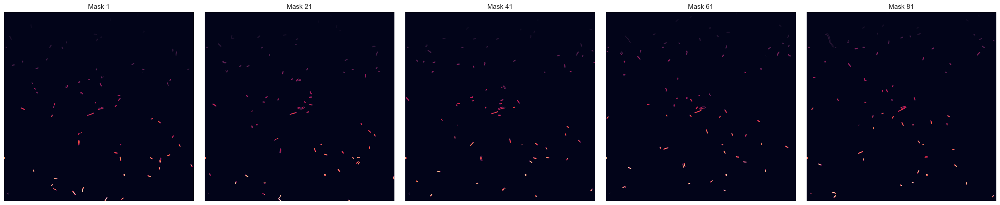

In [26]:
# Display omnipose frames after applying grayscale thresholding
images_to_show_count = 5 if len(working_frames) > 5 else len(working_frames)
images_per_row = images_to_show_count

if run_omnipose_thresholding and not load_masks:
    # Display frames after applying grayscale thresholding
    identify_pose.show_working_masks(
        images_to_show_count=images_to_show_count,
        images_per_row=images_per_row,
        use_gray_cmap=False
        )

# Use `identify.apply_color_inverse(is_update_masks=True)` to update and inverse the colors of the frames.


## 2.5: Select Thresholding Method

In [31]:
# Select the identify object to use for further processing based on the segmentation or thresholding run.
if run_segmentation or run_omnipose_thresholding and not load_masks:
    identify=identify_pose # select what segmentation to use.


# Step 3: Feature Scoping

## 3.0: Run Feature Scoping

In [32]:
# Run feature scoping
run_feature_scoping = True


## 3.1: Load/Generate Region Files

### 3.1.1: Load Region Files

In [33]:
load_region_props = False # Load region properties if they have been previously computed and saved.

if run_feature_scoping and load_region_props:
    # Load previously computed region properties
    active_region_props_df = identify.load_region_props_from_file(
        "./02_Outputs/02_Identified_Objects/01_Identified_Objects.pkl" # If the companion filtered file exists it will load it as well
        )

    region_props_df = identify.get_full_region_props_dataframe()
    filtered_region_props_df = identify.get_filtered_region_props_dataframe()

    # Display the loaded DataFrames
    region_props_df
    filtered_region_props_df


### 3.1.2: Generate Region Properties

In [34]:
# Generate Region Properties
if run_feature_scoping and not load_region_props:
    # Specify the properties you want to view
    view_props = [
        AvailableProps.LABEL, # Label is mandatory for the region properties
        AvailableProps.AREA,
        AvailableProps.CENTROID,
        AvailableProps.MAJOR_AXIS_LENGTH,
        AvailableProps.MINOR_AXIS_LENGTH,
        ]

    # Generate region properties for the frames and store them in a DataFrame
    region_props_df = identify.generate_region_props_to_dataframe(view_props)

    # Display the DataFrame
    region_props_df


Generating region properties: 100%|██████████| 100/100 [00:01<00:00, 50.00it/s]

Region properties generated successfully.


## 3.2: Gaussian Fit on Centroids to Increase Accuracy (Optional)

### 3.2.1: Parameter Test

In [35]:
# Run Gaussian Fit on a Frame
run_gaussian_fit = False # Can be incredibly time-consuming.

# Test Gaussian Fit on a Frame
if run_gaussian_fit and not load_region_props:
    identify.visualize_gaussian_fit_on_a_frame(frame_index=1, fit_window=7)


### 3.2.2: Process all centroids/frames and update DF

In [36]:
# Run Gaussian Fit on all frames
run_gaussian_fit = False # Can be incredibly time-consuming.

if run_gaussian_fit and not load_region_props:
    # Optimize Centroids using Gaussian Fit
    if run_feature_scoping:
        identify.optimize_centroids_using_gaussian_fit(
            fit_window=7,
            output_file_name="./02_Outputs/02_Identified_Objects/01_Identified_Objects", # Metada File
            )


## 3.3: Region Analysis

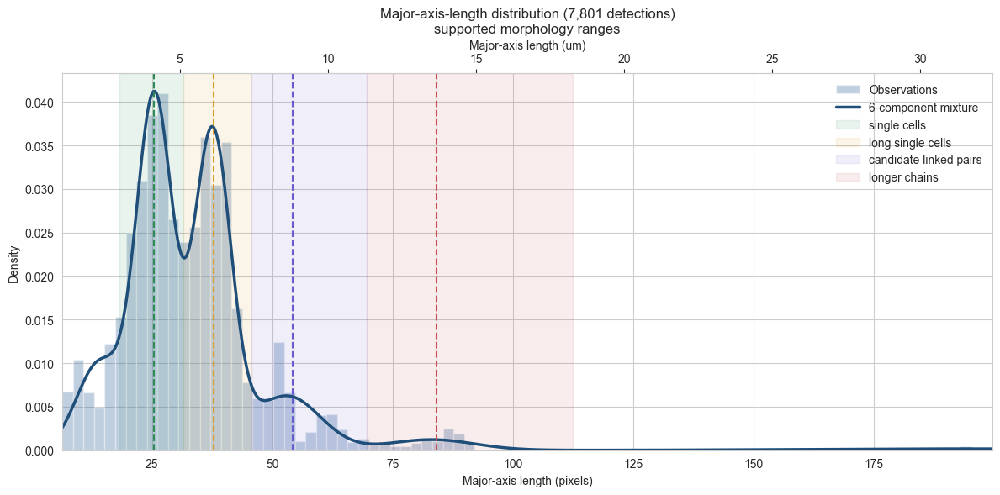

Analyzed 7,801 detections using a 6-component major-axis-length model.
Supported morphology ranges were identified successfully.
- Single-cell, long-single-cell, and candidate-linked-pair modes have compatible length and area scaling.
- The following mode also supports a longer-chain range.


,lower_bound_pixels,upper_bound_pixels,model_mean_pixels,mean_pixels,median_pixels,standard_deviation_pixels,count,fraction,lower_bound_scale_units,upper_bound_scale_units,mean_scale_units,standard_deviation_scale_units,mean_area,mean_minor_axis_length
classification,,,,,,,,,,,,,,
single_cells,18.336277,31.634191,25.531978,25.501271,25.654254,3.236177,3022,0.387386,2.979645,5.140556,4.143957,0.525879,212.330576,11.000828
long_single_cells,31.634191,45.747577,37.552489,37.780732,37.735420,3.414783,2785,0.357006,5.140556,7.433981,6.139369,0.554902,317.600718,11.340916
candidate_linked_pairs,45.747577,69.534666,52.981441,54.293667,52.379166,5.976515,800,0.102551,7.433981,11.299383,8.822721,0.971184,442.748750,12.051748
longer_chains,69.534666,112.354686,83.048147,84.028489,85.745254,7.724576,203,0.026022,11.299383,18.257636,13.654629,1.255244,632.024631,14.000922


In [37]:
# Perform Major_Axis_Length distribution Analysis on the Generated Regions/Identified Objects
# This analysis tool is just a simple fast visual guide to select a decent major axis length filter
run_analysis = True

if run_analysis:
    region_analysis = identify.analyze_major_axis_length_distribution(
        dataframe=region_props_df
        )

    display(region_analysis["classification_ranges"])

    classified_objects = region_analysis["classified_dataframe"]
    single_cells = classified_objects.query(
        "major_axis_length_class == 'single_cells'"
        )


## 3.4: Region Filtering

In [41]:
# Filter the regions
filter_regions = True  # Filter the regions based on specific properties

if run_feature_scoping and filter_regions: # This lets you filter full region properties, freshly generated or loaded ones. It will overwrite loaded filtered regions
    # importing the list module
    from typing import List

    # Apply filters to keep region properties; multiple filters are combined using 'AND' logic
    props_threshold: List[PropsThreshold] = [
        {
        'property': AvailableProps.AREA,                # Property to filter on: "LABEL", "AREA", "CENTROID", "MAJOR_AXIS_LENGTH", "MINOR_AXIS_LENGTH"
        'operation': AvailableOperations.GREATER_THAN,  # Operation to perform: "GREATER_THAN", "LESS_THAN", "EQUALS"
        'value': 20                                     # Value to compare with
        },
        {
        'property': AvailableProps.MAJOR_AXIS_LENGTH,
        'operation': AvailableOperations.LESS_THAN,
        'value': 45
        },
        {
        'property': AvailableProps.MAJOR_AXIS_LENGTH,
        'operation': AvailableOperations.GREATER_THAN,
        'value': 10
        }
        ]

    # Apply filters on the generated region properties
    filtered_region_props_df = identify.apply_filters_on_region_props(props_threshold, is_update_dataframes = True)

    # Display the DataFrame
    filtered_region_props_df


Filters applied successfully.
Full region count: 7801; filtered region count: 6396


## 3.5: Filtered Region Analysis

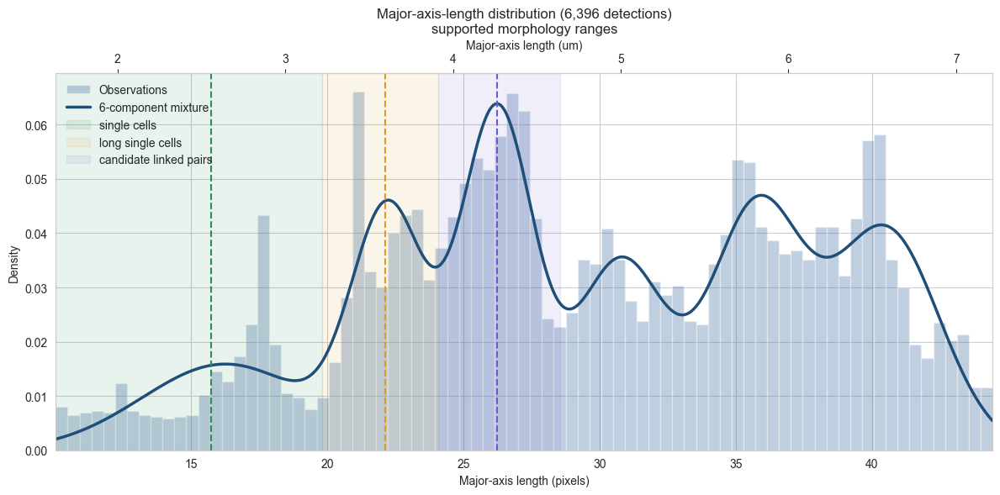

Analyzed 6,396 detections using a 6-component major-axis-length model.
Supported morphology ranges were identified successfully.
- Single-cell, long-single-cell, and candidate-linked-pair modes have compatible length and area scaling.
- No following mode satisfied the longer-chain scaling checks.


,lower_bound_pixels,upper_bound_pixels,model_mean_pixels,mean_pixels,median_pixels,standard_deviation_pixels,count,fraction,lower_bound_scale_units,upper_bound_scale_units,mean_scale_units,standard_deviation_scale_units,mean_area,mean_minor_axis_length
classification,,,,,,,,,,,,,,
single_cells,-inf,19.811358,16.262333,15.750568,16.666440,2.653857,720,0.112570,-inf,3.219346,2.559467,0.431252,107.106944,9.348691
long_single_cells,19.811358,24.074488,22.239134,22.115706,22.132887,1.108803,967,0.151188,3.219346,3.912104,3.593802,0.180181,193.311272,11.387322
candidate_linked_pairs,24.074488,28.548501,26.230334,26.232409,26.329378,1.135461,1355,0.211851,3.912104,4.639131,4.262766,0.184512,219.245756,10.979959


In [42]:
# Perform Major_Axis_Length distribution Analysis on the filtered Generated Regions/Identified Objects
run_analysis = True

if run_analysis:
    filtered_region_analysis = identify.analyze_major_axis_length_distribution(
        dataframe=filtered_region_props_df
        )

    display(filtered_region_analysis["classification_ranges"])

    classified_objects_filtered = filtered_region_analysis["classified_dataframe"]
    single_cells_filtered = classified_objects_filtered.query(
        "major_axis_length_class == 'single_cells'"
        )


## 3.6: Feature Plotting And Export

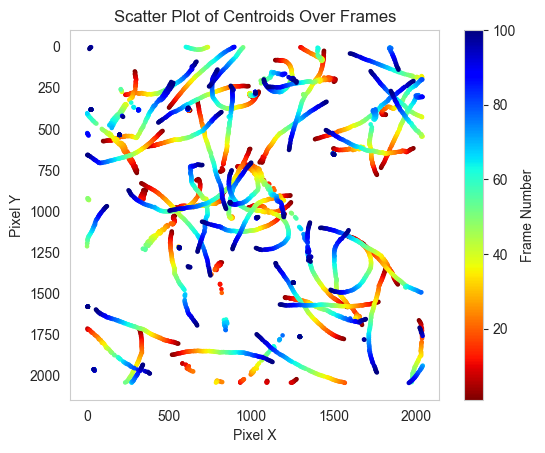

Full identified objects saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects.csv
Filtered identified objects saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects_Filtered.csv
Applied filter settings saved successfully to path:  ././02_Outputs/02_Identified_Objects/Applied_Filter_Settings.csv
Identified objects workbook saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects_Complete.xlsx
Full identified objects pickle saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects.pkl
Filtered identified objects pickle saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects_Filtered.pkl
Applied filter settings pickle saved successfully to path:  ././02_Outputs/02_Identified_Objects/Applied_Filter_Settings.pkl
Full identified objects NumPy file saved successfully to path:  ././02_Outputs/02_Identified_Objects/01_Identified_Objects.

In [43]:
# Save identified objects
save_objects = True  # Save/Overwrite the identified objects to a file

if run_feature_scoping:
    # Plot the filtered region properties
    identify.plot_centroids(show_time=True)

    if save_objects:
        identify.save_identified_objects(
            output_file_name="./02_Outputs/02_Identified_Objects/01_Identified_Objects"
            )


# Step 4: Tracking

## 4.1: Initialize Advanced Tracker


In [44]:
# Initialize the advanced Tracker with the selected Identify object
tracker_advanced = Tracker(identify_object=identify)


## 4.2: Link Particles and Filter Tracks

### 4.2.1: Advanced Tracker


#### 4.2.1.1: Link/Load Particles

In [45]:
# Load linked particles if they have been previously computed and saved.
load_linked_particles_advanced = False

if load_linked_particles_advanced:
    # Load previously computed linked particles
    tracker_advanced.load_linked_dataframes(
        input_file_name="./02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.pkl",
        filtered_input_file_name = None,
        updated_input_file_name = None,
    )
    
    tracker_advanced.get_linked_particles_metadata()

    linked_particles_advanced_df = tracker_advanced.get_full_linked_particles_dataframe()
    linked_filtered_particles_advanced_df = tracker_advanced.get_filtered_linked_particles_dataframe()
    linked_updated_particles_advanced_df = tracker_advanced.get_updated_linked_particles_dataframe()

else:
    # Link particles across frames with the advanced method.
    # Compatibility fallback: link_particles_with_features() delegates to the
    # upstream RABiTPy/TrackPy-compatible linker with feature_columns=None (or []),
    # feature_weights=None (or {}), max_step_distance=None, edge_max_memory=None,
    # momentum_weight=0.0, direction_weight=0.0, and momentum_window=0.
    # The retained TrackPy linker can also be called directly with link_particles().
    linked_particles_advanced_df = tracker_advanced.link_particles_with_features(
        max_distance=20,          # Distance from the last observed position to the candidate detection
        max_step_distance=20,     # Distance from the predicted next position to the candidate detection
        max_memory=30,
        edge_max_memory=0,        # Shorter memory after a particle reaches an image edge
        edge_margin=15,           # Edge boundary width in pixels
        position_columns=["centroid_x", "centroid_y"],
        feature_columns=["area", "major_axis_length", "minor_axis_length"],
        feature_weights={
            "area": 0,
            "major_axis_length": 50.0,
            "minor_axis_length": 1.0,
            },
        feature_averaging_window=5,         # Past morphology detections per active track
        future_feature_averaging_window=5,  # Candidate plus consecutive future detections
        momentum_weight=2,
        momentum_window=3,
        direction_weight=2,
        is_update_particles=True
    )


Linking particles with features: 100%|██████████| 100/100 [00:16<00:00,  6.02it/s]


Successfully linked 186 particles using position, morphology, and momentum.


#### 4.2.1.2: Particle Analysis

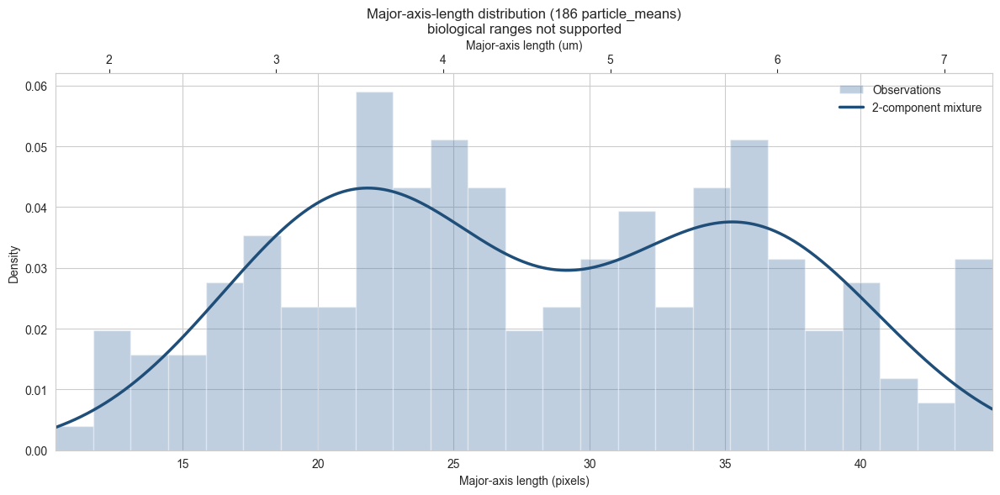

Analyzed 186 particle_means using a 2-component major-axis-length model.
Biological morphology ranges were not assigned automatically.
- Fewer than three distribution modes were selected.


In [46]:
# Perform Major_Axis_Length distribution Analysis on the full particles/tracks
run_analysis = True

if run_analysis:
    tracker_advanced_analysis = identify.analyze_major_axis_length_distribution(
        dataframe=linked_particles_advanced_df,
        aggregate_by_particle=True,
        show_plot=True,
        )

    particle_classes_advanced = tracker_advanced_analysis["classified_dataframe"][
        ["particle", "major_axis_length_class"]
        ]

    classified_tracks_advanced = linked_particles_advanced_df.merge(
        particle_classes_advanced,
        on="particle",
        how="left",
        )


#### 4.2.1.3: Filter Particles

In [49]:
# Retain particles with enough detections and cumulative observed path length
filter_particles = True  # Filter particles based on specific criteria

if filter_particles:
    linked_filtered_particles_advanced_df = tracker_advanced.filter_particles(
        min_frames=50,
        min_total_path=100,  # Minimum cumulative path length in pixels (> comparison)
        min_displacement=100, # Minimum displacement (> comparison)
        is_update_particles=True,
        display_eliminated_particles=True
        )

    eliminated_particles_advanced_df = tracker_advanced.get_eliminated_particles_dataframe()


After filtering for at least 50 detections: 58 unique particles
After requiring cumulative path length > 100 pixels: 52 unique particles
After requiring initial-to-final displacement > 100 pixels: 49 unique particles
Eliminated particle counts by reason:
elimination_reason
detection_count_below_minimum                  128
cumulative_path_length_not_above_minimum         6
endpoint_net_displacement_not_above_minimum      3
Eliminated particle audit:
 particle                          elimination_reason  detection_count  frame_count  endpoint_net_displacement_pixels  cumulative_path_length_pixels  max_displacement_from_start_pixels
      2.0               detection_count_below_minimum               31           31                        191.277999                     213.436647                          191.277999
      3.0               detection_count_below_minimum                5            5                         19.429745                      19.689763                           1

#### 4.2.1.4: Filtered Particle Analysis

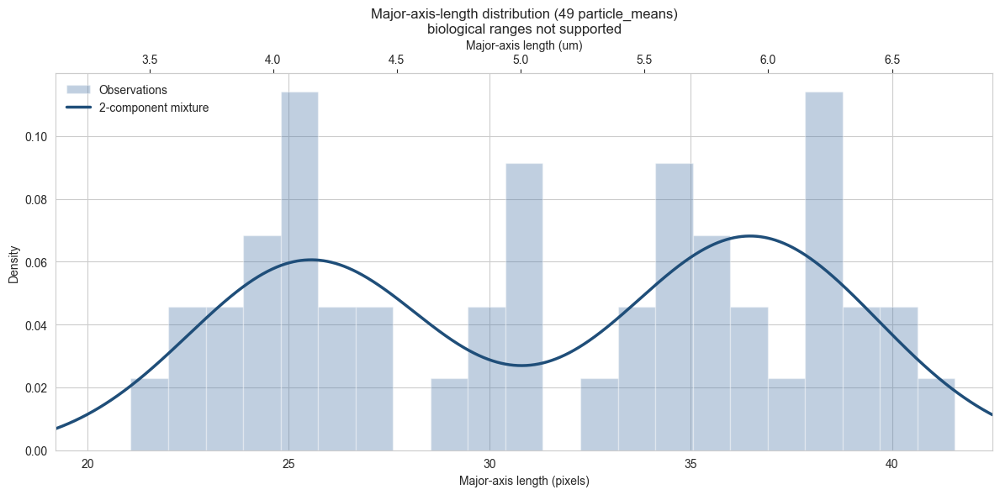

Analyzed 49 particle_means using a 2-component major-axis-length model.
Biological morphology ranges were not assigned automatically.
- Fewer than three distribution modes were selected.


In [50]:
# Perform Major_Axis_Length distribution Analysis on the filtered particles/tracks
run_analysis = True

if run_analysis:
    filtered_tracker_advanced_analysis = identify.analyze_major_axis_length_distribution(
        dataframe=linked_filtered_particles_advanced_df,
        aggregate_by_particle=True,
        show_plot=True,
        )

    filtered_particle_classes_advanced = filtered_tracker_advanced_analysis["classified_dataframe"][
        ["particle", "major_axis_length_class"]
        ]

    filtered_classified_tracks_advanced = linked_filtered_particles_advanced_df.merge(
        filtered_particle_classes_advanced,
        on="particle",
        how="left",
        )


#### 4.2.1.5: Export Linked and Filtered Particles

In [51]:
# Save linked dataframes
save_linked_dataframes = True  # Save/Overwrite the linked particles dataframes to a file

if save_linked_dataframes:
    tracker_advanced.save_linked_dataframes(
        output_file_name='./02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker',
        save_filtered=True,
        save_updated=True,
        save_eliminated=True,
        save_track_details=True,
        save_possible_collisions=True,
        collision_source='all',  # 'active', 'full', 'filtered', 'updated', or 'all'
        collision_distance_threshold=None  # None uses paired major-axis lengths
        )
    

Full linked dataframe saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.csv
Filtered linked dataframe saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_filtered.csv
Eliminated-particle audit saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_eliminated.csv
Linked dataframe metadata csv saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_metadata.csv
Particle filter settings csv saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_filter_settings.csv
Linked dataframe workbook saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.xlsx
Possible-collision review exported: 141 events from full, filtered tracks.
Full linked dataframe pickle saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Track

## 4.3: Track Plots

### 4.3.0: Execute Plots

In [52]:
# Run plots
run_advanced_tracker_plots = True


### 4.3.1: Plot Trajectories

#### 4.3.1.1: Track.py Style Plot

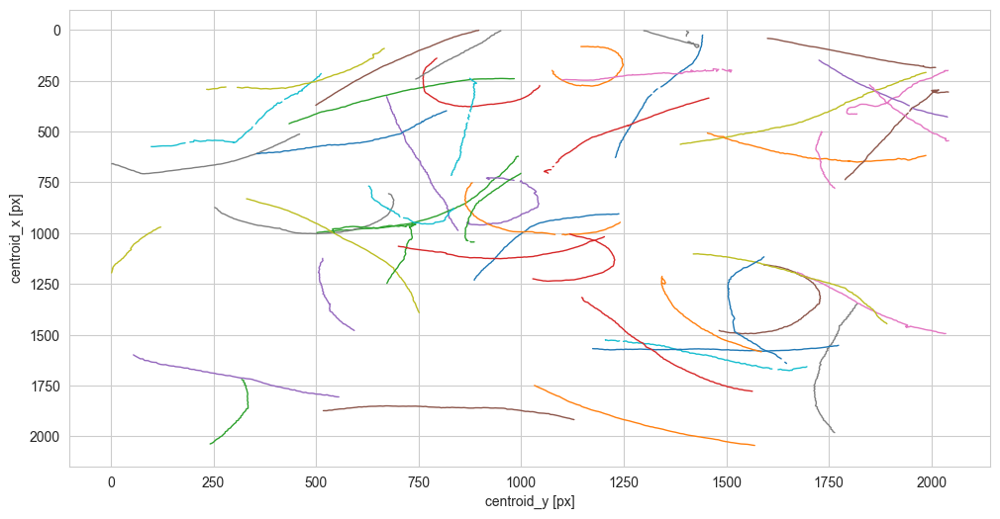

Trackpy trajectories plotted successfully for filtered tracks.


In [53]:
# DataFrame to plot:
dataframe_to_plot=["filtered"] # ["full", "filtered", "updated"]

if run_advanced_tracker_plots:
    # Original Trackpy-style plot
    tracker_advanced.plot_trajectories_using_trackpy(
        dataframe_to_plot=dataframe_to_plot
        )


#### 4.3.1.2: Matplotlib Plot

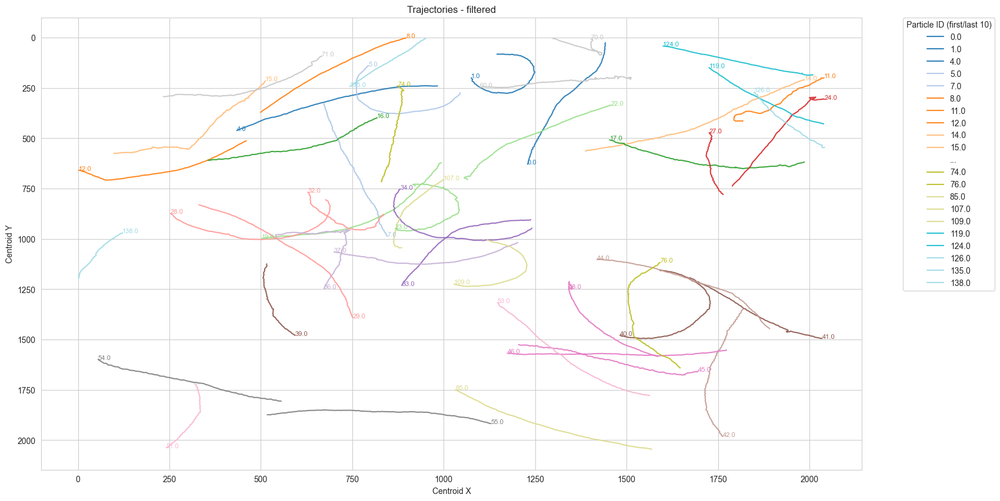

Matplotlib trajectories plotted successfully for filtered tracks.


In [54]:
# DataFrame to plot:
dataframe_to_plot=["filtered"] # ["full", "filtered", "updated"]

if run_advanced_tracker_plots:
    # Custom plot with legend, larger figure, and optional overlaid IDs
    tracker_advanced.plot_trajectories_using_matplotlib(
        dataframe_to_plot=dataframe_to_plot,
        figsize=(18, 10),
        show_particle_ids=True
        )


#### 4.3.1.3: Scatter Plot

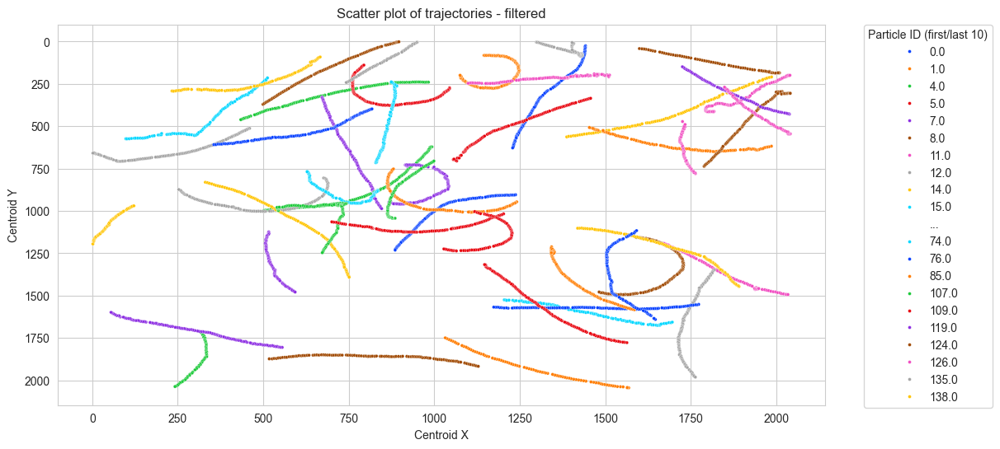

In [55]:
# DataFrame to plot:
dataframe_to_plot=["filtered"] # ["full", "filtered", "updated"]

if run_advanced_tracker_plots:
    # Plot trajectories using scatter plot
    tracker_advanced.sort_and_plot_scatter_of_trajectories(dataframe_to_plot=dataframe_to_plot)


### 4.3.2. Trajectories from Origin

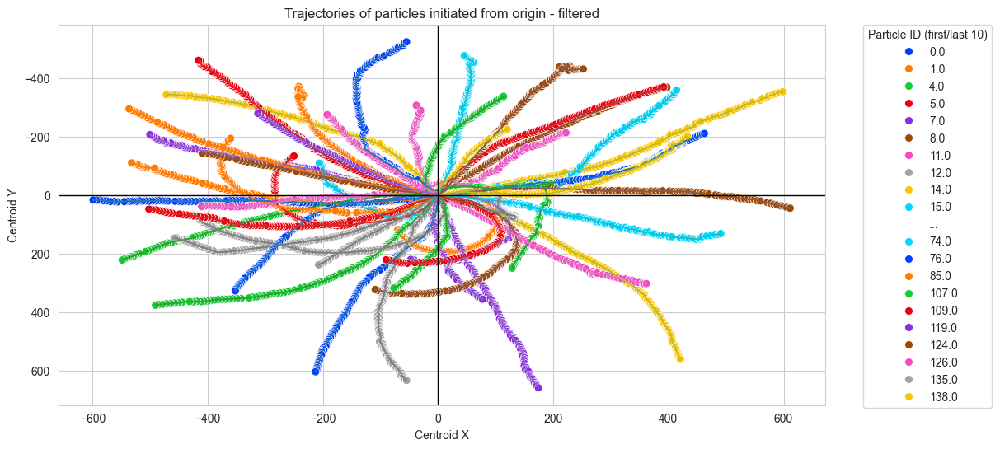

In [56]:
# DataFrame to plot:
dataframe_to_plot=["filtered"] # ["full", "filtered", "updated"]

if run_advanced_tracker_plots:
    # Scatter plot around origin
    tracker_advanced.visualize_particle_trajectories_from_origin(dataframe_to_plot=dataframe_to_plot)


### 4.3.3. Motility Heatmap

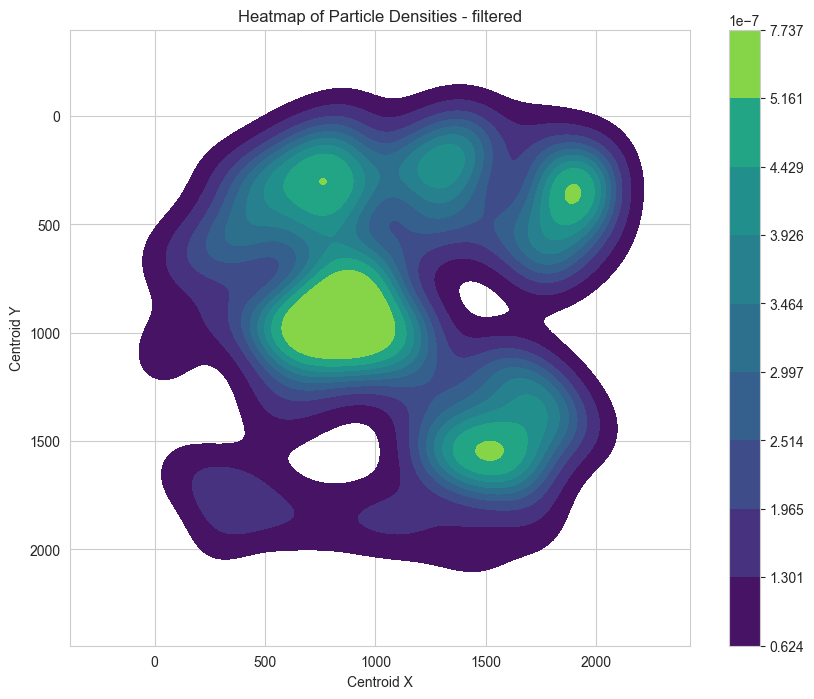

In [57]:
# DataFrame to plot:
dataframe_to_plot=["filtered"] # ["full", "filtered", "updated"]

if run_advanced_tracker_plots:
    # Heatmap of particles
    tracker_advanced.visualize_particle_heatmap(dataframe_to_plot=dataframe_to_plot)


## 4.4. Video Overlay

### 4.4.1: Advanced Tracker


#### 4.4.1.1: No Tracks

In [62]:
# Export video from the file frames with no tracks
export_advanced_tracker_video = False
no_tracks_video_file_title = "Video_No_Tracks"

if export_advanced_tracker_video:
    # Overlay tracks on video
    tracker_advanced.overlay_tracks_on_video(
        output_video_filename=f"./01_Inputs/01_ND2_Video/{no_tracks_video_file_title}.mp4",
        colormap_name="viridis",
        show_labels=True,
        label_offset_x=0,
        label_offset_y=0,
        font_scale=1.2,
        dataframe=linked_particles_advanced_df, # Explicit DataFrame to overlay
        tracks_to_overlay=None, # Use a count, inclusive ID range such as (10, 30), "all", or None
        specific_tracks_to_overlay=None, # Example: [3, 4]
        video_quality="high", # "original"/"high", "medium", "low", or "preview"
        video_codec="mp4v", # Auto: mp4v for MP4/MOV/M4V; MJPG for AVI
        )


#### 4.4.1.2: Full

In [63]:
# Export video with overlaid tracks
export_advanced_tracker_video = True
df_exported = "01_Full"

if export_advanced_tracker_video:
    # Overlay tracks on video
    tracker_advanced.overlay_tracks_on_video(
        output_video_filename=f"./02_Outputs/04_Video_Overlays/{df_exported}_Tracks_–_Tracker_Advanced_–_Frames({start_frame}-{end_frame}).mp4",
        colormap_name="viridis",
        show_labels=True,
        label_offset_x=0,
        label_offset_y=0,
        font_scale=1.2,
        dataframe=linked_particles_advanced_df, # Explicit DataFrame to overlay
        tracks_to_overlay="all", # Use a count, inclusive ID range such as (10, 30), "all", or None
        specific_tracks_to_overlay=None, # Example: [3, 4]
        video_quality="high", # "original"/"high", "medium", "low", or "preview"
        video_codec="mp4v", # Auto: mp4v for MP4/MOV/M4V; MJPG for AVI
        )


Overlaying 186 of 186 available particle tracks.


Overlaying Tracks on Video: 100%|██████████| 100/100 [00:02<00:00, 36.11it/s]

Processed high quality video with overlaid tracks saved to ././02_Outputs/04_Video_Overlays/01_Full_Tracks_–_Tracker_Advanced_–_Frames(1-100).mp4


#### 4.4.1.3: Filtered

In [66]:
# Export video with overlaid tracks
export_advanced_tracker_video = False
df_exported = "02_Filtered"

if export_advanced_tracker_video:
    # Overlay tracks on video
    tracker_advanced.overlay_tracks_on_video(
        output_video_filename=f"./02_Outputs/04_Video_Overlays/{df_exported}_Tracks_–_Tracker_Advanced_–_Frames({start_frame}-{end_frame}).mp4",
        colormap_name="viridis",
        show_labels=True,
        label_offset_x=0,
        label_offset_y=0,
        font_scale=1.2,
        dataframe=linked_filtered_particles_advanced_df, # Explicit DataFrame to overlay
        tracks_to_overlay="all", # Use a count, inclusive ID range such as (10, 30), "all", or None
        specific_tracks_to_overlay=None, # Example: [3, 4]
        video_quality="high", # "original"/"high", "medium", "low", or "preview"
        video_codec=None, # Auto: mp4v for MP4/MOV/M4V; MJPG for AVI
        )


#### 4.4.1.4: Filtered — Batched Tracks

In [65]:
# Export video with overlaid tracks
export_advanced_tracker_video_batched = False
df_exported = "02_Filtered"

if export_advanced_tracker_video_batched:
    # Get all available track IDs in sorted order
    available_track_ids = sorted(
        linked_filtered_particles_advanced_df["particle"]
        .dropna()
        .unique()
        .tolist()
        )

    tracks_per_video = 10

    for batch_start in range(0, len(available_track_ids), tracks_per_video):
        track_batch = available_track_ids[
            batch_start:batch_start + tracks_per_video
            ]

        first_track = track_batch[0]
        last_track = track_batch[-1]

        print(
            f"Exporting tracks {first_track:.0f}-{last_track:.0f} "
            f"({len(track_batch)} tracks)"
            )

        tracker_advanced.overlay_tracks_on_video(
            output_video_filename=f"./02_Outputs/04_Video_Overlays/02_Filtered_Batched/{df_exported}_Tracks({first_track:.0f}-{last_track:.0f}).mp4",
            colormap_name="viridis",
            show_labels=True,
            label_offset_x=0,
            label_offset_y=0,
            font_scale=1.2,
            dataframe=linked_filtered_particles_advanced_df,
            tracks_to_overlay=None,
            specific_tracks_to_overlay=track_batch,
            video_quality="high",
            video_codec=None,
            )


# Step 5: Update Tracking

## 5.0: Execution Flag

In [58]:
# Run the optional advanced-track label update blocks
update_advanced_tracks = True


## 5.1: Update Advanced Tracker Label Links


### 5.1.1: Particle Lookup

In [67]:
# Lookup specific particles and their frame ranges
if update_advanced_tracks:
    lookup_particle=[0]

    particle_ranges = tracker_advanced.lookup_particle(
        lookup_particle,
        source_dataframe="full",
    )

Particle frame ranges from full tracks:
 particle  first_frame  last_frame  frame_count  row_count  duplicate_frame_count
        0          1.0       100.0           98         98                      0


### 5.1.2: Link/Delete Labels

In [76]:
# Update advanced tracker particle labels manually depending on the type of analysis you are performing.
# For run and tumbles, tracks of cells that are stuck, circling around the plate (posibly from surface interactions), or not singlets should be deleted.
if update_advanced_tracks:
    particles_to_add=[167] # Add filtered out particles/tracks 

    particles_to_link=[(32,167)] # (Particle_ID_1,Particle_ID_2,...)
    link_frame_range=[]

    particles_to_delete=[(1,(None)),
                         (5,(None)),
                         (15,(20,20)), # A single frame blip will most likely be smoothed out in the analysis though you can manually remove it as well
                         (23,(None)),
                         (24,(None)),
                         (40,(None)),
                         (109,(None))
                         ]# (Particle_ID,(Range)). Can declare the range as: (None, end), (start,), (start, None)
    #delete_frame_range=[] # Can declare delete_frame_range within particles_to_delete.

    particles_to_split=[] #(Particle_ID,Frame_to_split_from)
    #split_from_frame=[] # Can declare split_from_frame within particles_to_split.

    linked_updated_particles_advanced_df = tracker_advanced.manually_update_particle_labels(
        particles_to_link=particles_to_link,
        link_frame_range=link_frame_range,
        particles_to_delete=particles_to_delete,
        #delete_frame_range=delete_frame_range,
        particles_to_split=particles_to_split,
        #split_from_frame=split_from_frame,
        source_dataframe="filtered",
        particles_to_add=particles_to_add,
        df_to_add_from="full"
        )
    
    ####################################################
    # Run second (or as many as needed) cycle of updating to deal with complex cases of linking after splitting
    particles_to_link=[]
    link_frame_range=[]

    particles_to_delete=[]
    delete_frame_range=[]

    particles_to_split=[]
    split_from_frame=[]

    linked_updated_particles_advanced_df = tracker_advanced.manually_update_particle_labels(
        particles_to_link=particles_to_link,
        link_frame_range=link_frame_range,
        particles_to_delete=particles_to_delete,
        delete_frame_range=delete_frame_range,
        particles_to_split=particles_to_split,
        split_from_frame=split_from_frame,
        source_dataframe="updated"
        )


Restored particle 167 from 'full' tracks: replaced 0 target row(s) with 25 donor row(s).
Resolved 1 overlapping frame(s) for particles 32 and 167; retained rows from lower-numbered particle 32.
Manual particle label update complete. Updated dataframe has 43 unique particles and 3742 rows.
Restored particle labels: [{'particle': 167, 'source_dataframe': 'full', 'replaced_target_row_count': 0, 'restored_row_count': 25}]
Merged labels using replacement map: {167: 32}
Deleted complete particle labels: [1, 5, 23, 24, 40, 109]
Deleted particle frame ranges: {15: [(20, 20)]}
Manual particle label update complete. Updated dataframe has 43 unique particles and 3742 rows.


### 5.1.3: Updated Particle Analysis

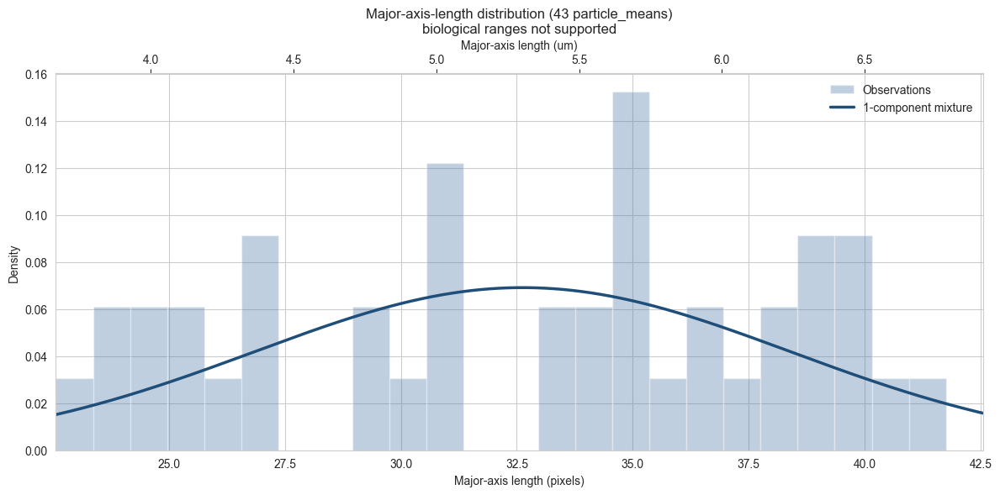

Analyzed 43 particle_means using a 1-component major-axis-length model.
Biological morphology ranges were not assigned automatically.
- Fewer than three distribution modes were selected.


In [77]:
# Perform Major_Axis_Length distribution Analysis on the updated particles/tracks
run_analysis = True

# Updated Track Analysis
if run_analysis and update_advanced_tracks:
    updated_tracker_advanced_analysis = identify.analyze_major_axis_length_distribution(
        dataframe=linked_updated_particles_advanced_df,
        aggregate_by_particle=True,
        show_plot=True,
        )

    updated_particle_classes_advanced = updated_tracker_advanced_analysis["classified_dataframe"][
        ["particle", "major_axis_length_class"]
        ]

    updated_classified_tracks_advanced = linked_updated_particles_advanced_df.merge(
        updated_particle_classes_advanced,
        on="particle",
        how="left",
        )


### 5.1.4: Plot Updated Plot

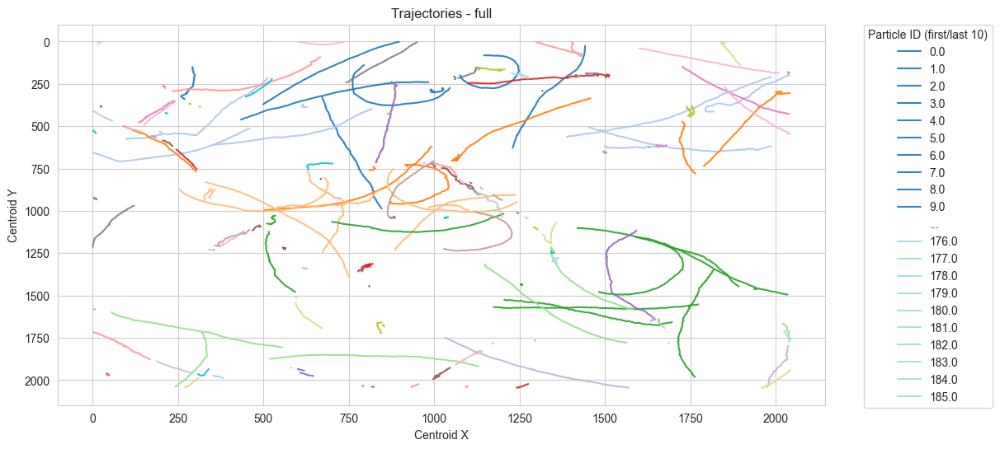

Matplotlib trajectories plotted successfully for full tracks.


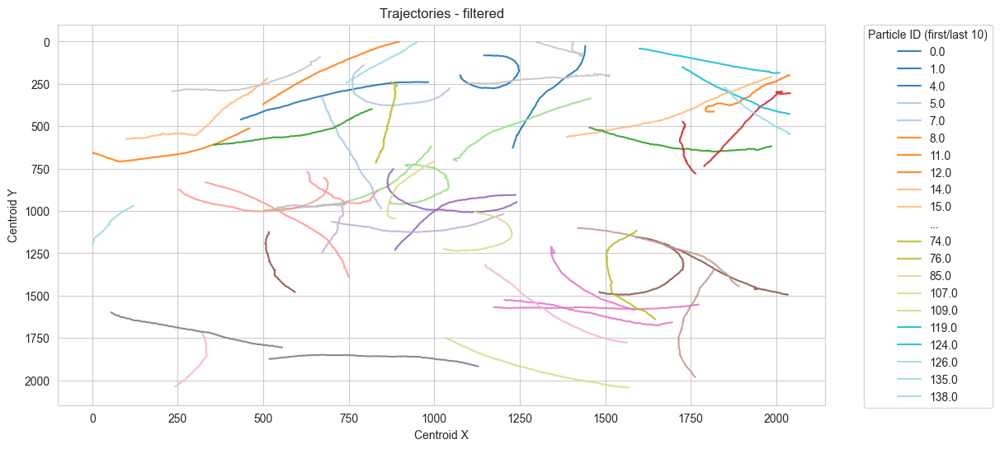

Matplotlib trajectories plotted successfully for filtered tracks.


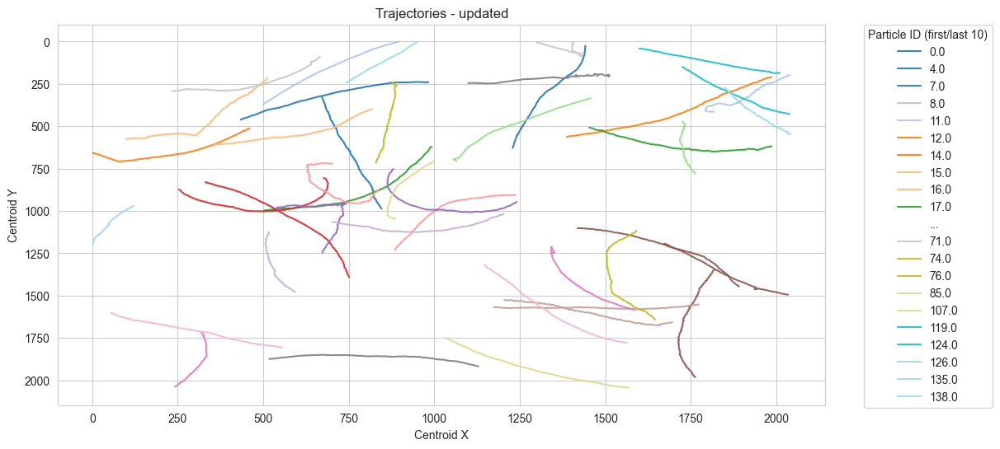

Matplotlib trajectories plotted successfully for updated tracks.


In [78]:
# Plot the Updated Trajectories after manually updating particle labels
dataframe_to_plot = ["full", "filtered", "updated"]

if update_advanced_tracks:
    tracker_advanced.plot_trajectories_using_matplotlib(dataframe_to_plot=dataframe_to_plot)


### 5.1.5: Export Updated Particles

In [79]:
# Save linked dataframes
save_linked_dataframes = True  # Save/Overwrite the linked particles dataframes to a file

if update_advanced_tracks and save_linked_dataframes:
    tracker_advanced.save_linked_dataframes(
        output_file_name='./02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker',
        save_eliminated=True,
        save_track_details=True,
        save_possible_collisions=True,
        collision_source='all',  # 'active', 'full', 'filtered', 'updated', or 'all'
        collision_distance_threshold=None  # None uses paired major-axis lengths
        )


Full linked dataframe saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.csv
Filtered linked dataframe saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_filtered.csv
Updated linked dataframe saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_updated.csv
Eliminated-particle audit saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_eliminated.csv
Linked dataframe metadata csv saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_metadata.csv
Particle filter settings csv saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker_filter_settings.csv
Linked dataframe workbook saved to ././02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.xlsx
Possible-collision review e

### 5.1.6: Video Overlay

#### 5.1.6.1: Updated

In [80]:
# Export video with overlaid tracks
export_advanced_tracker_video = True
video_quality="high" # "original"/"high", "medium", "low", or "preview"
tracks_to_overlay="all" # Use a count, inclusive ID range such as (10, 30), "all", or None
specific_tracks_to_overlay=None # Example: [3, 4]

if update_advanced_tracks and export_advanced_tracker_video:
    # Overlay tracks on video
    tracker_advanced.overlay_tracks_on_video(
        output_video_filename=f"./02_Outputs/04_Video_Overlays/03_Updated_Tracks_–_Tracker_advanced_–_Frames({start_frame}-{end_frame})_{video_quality}.mp4",
        colormap_name="viridis",
        show_labels=True,
        label_offset_x=0,
        label_offset_y=0,
        font_scale=1.5,
        dataframe=linked_updated_particles_advanced_df, # Explicit DataFrame to overlay
        tracks_to_overlay=tracks_to_overlay, # Count, inclusive ID range, "all", or None
        specific_tracks_to_overlay=specific_tracks_to_overlay, # Example: [3, 4]
        video_quality=video_quality, # "original"/"high", "medium", "low", or "preview"
        video_codec="mp4v", # Auto: mp4v for MP4/MOV/M4V; MJPG for AVI
        )


Overlaying 43 of 43 available particle tracks.


Overlaying Tracks on Video: 100%|██████████| 100/100 [00:02<00:00, 36.88it/s]

Processed high quality video with overlaid tracks saved to ././02_Outputs/04_Video_Overlays/03_Updated_Tracks_–_Tracker_advanced_–_Frames(1-100)_high.mp4


#### 5.1.6.2: Updated — Batched Tracks

In [81]:
# Export video with overlaid tracks
export_advanced_tracker_video_batched = False
df_exported = "03_Updated"

if export_advanced_tracker_video_batched:
    # Get all available track IDs in sorted order
    available_track_ids = sorted(linked_updated_particles_advanced_df["particle"].dropna().unique().tolist())
    tracks_per_video = 10

    for batch_start in range(0, len(available_track_ids), tracks_per_video):
        track_batch = available_track_ids[
            batch_start:batch_start + tracks_per_video
            ]

        first_track = track_batch[0]
        last_track = track_batch[-1]

        print(
            f"Exporting tracks {first_track:.0f}-{last_track:.0f} "
            f"({len(track_batch)} tracks)"
            )

        tracker_advanced.overlay_tracks_on_video(
            output_video_filename=f"./02_Outputs/04_Video_Overlays/03_Updated_Batched/{df_exported}_Tracks({first_track:.0f}-{last_track:.0f}).mp4",
            colormap_name="viridis",
            show_labels=True,
            label_offset_x=0,
            label_offset_y=0,
            font_scale=1.5,
            dataframe=linked_updated_particles_advanced_df,
            tracks_to_overlay=None,
            specific_tracks_to_overlay=track_batch,
            video_quality="high",
            video_codec=None,
            )


# Step 6: Basic Statistics

## 6.0: Load Particle Dataframes

In [ ]:
# Load linked particles if they have been previously computed and saved.
# Run this block to avoid needing to run all previous sections.
# This way you can focus on the anlysis once segmentation and tracking have been completed.
# Will still need to run Step 0: Importing Libraries.
load_linked_particles_advanced_stats = False

# Declare the strain of the cells being analyzed.
cell_strain = "Strain_A"

# Load fps metadata workbook
load_metadata = True

if load_linked_particles_advanced_stats:
    # Restore calibration without relying on the optional FPS_Details.xlsx file.
    capture = Capture("./")

    if load_metadata:
        # Load the capture speed and spatial-scale details from the ND2 metadata workbook
        capture_properties = capture.load_capture_properties_from_file(
            "./01_Inputs/FPS_Details.xlsx"
            )
        capture_speed_in_fps = capture_properties["capture_speed_in_fps"]
        pixel_scale_factor = capture_properties["pixel_scale_factor"]
        scale_units = capture_properties["scale_units"]
        expected_frame_count = capture_properties["frames"]
        frame_resolution = capture_properties["resolution"]
        timestamp_first_frame = capture_properties["timestamp_first_frame"]
        timestamp_last_frame = capture_properties["timestamp_last_frame"]
    else:
        # Manually input the required metadata
        capture_speed_in_fps = 28.279
        pixel_scale_factor = 0.16
        scale_units = 'um'

    capture.set_properties(
        capture_speed_in_fps=capture_speed_in_fps,
        pixel_scale_factor=pixel_scale_factor,
        scale_units=scale_units,
        )

    # Set identify object
    identify = Identify(capture_frame_object=capture)

    # Set tracker object
    tracker_advanced = Tracker(identify_object=identify) # Tracker Module with advanced features

    # Load previously computed linked particles
    tracker_advanced.load_linked_dataframes(
        input_file_name="./02_Outputs/03_Linked_Particles/01_Advanced_Tracker/01_Linked_Particles_Advanced_Tracker.pkl",
        filtered_input_file_name = None,
        updated_input_file_name = None,
    )
    tracker_advanced.get_linked_particles_metadata()
    linked_particles_advanced_df = tracker_advanced.get_full_linked_particles_dataframe()
    linked_filtered_particles_advanced_df = tracker_advanced.get_filtered_linked_particles_dataframe()
    linked_updated_particles_advanced_df = tracker_advanced.get_updated_linked_particles_dataframe()


## 6.1: Initialize Stats Object

In [83]:
# DataFrame for statistics: "active", "full", "filtered", or "updated"
stats_dataframe = "updated"

# Initialize the stats object with the selected tracker DataFrame
stats_advanced = Stats(
    tracker_object=tracker_advanced,
    source_dataframe=stats_dataframe,
    strain=cell_strain,
    )


Stats source selected: updated (43 particles, 3742 rows).


## 6.2: Per Particle Speed Histogram and Mean Speed

In [85]:
# Calculate each particle's fitted mean speed
stats_advanced.calculate_speed_and_plot_mean(
    distribution_type="norm",
    ci_range=(5,95), # Retains only speeds inside those bounds for that particle
    bin_size=25,
    speed_unit="scale_units/s",  # Uses the Capture scale unit
    plot_results=False,  # False suppresses the per-particle plots
    discard_initial_frames=10,  # Remove detections in first 10-frame window
    discard_final_frames=10,  # Remove detections in final 10-frame window
    )


Total unique particles: 43


Calculating Speed: 100%|██████████| 43/43 [00:00<00:00, 573.00it/s]


array([ 29.39081101,  27.39776023,  31.50649413,  28.94425411,
        23.45359329,  24.68410302,  32.43380905,  28.75851707,
        25.07913455,  27.81759123,  30.49765566,  26.11919096,
        23.68129386,  27.83176238,  33.11821717,  23.63971037,
        24.26044467,  26.16447163,  25.33507933,  24.20956883,
        28.3423184 ,  30.57766585,  30.43687405,  28.227197  ,
        25.55914095,  27.23952916,  27.40809647,  32.42573593,
        29.61589565,  25.60873038,  27.94997007,  22.64465625,
        20.3178091 ,  26.43757949,  26.13817546,  30.41144944,
        33.28918038,  27.05313215,  30.24472247,  32.74616055,
        26.72667299,  28.88811514,  23.19429084])

## 6.3: Mean Speed Distribution & Export

Figure saved to ./02_Outputs/05_Basic_Stats/05_Overall Fitted Mean Speed Distribution.png


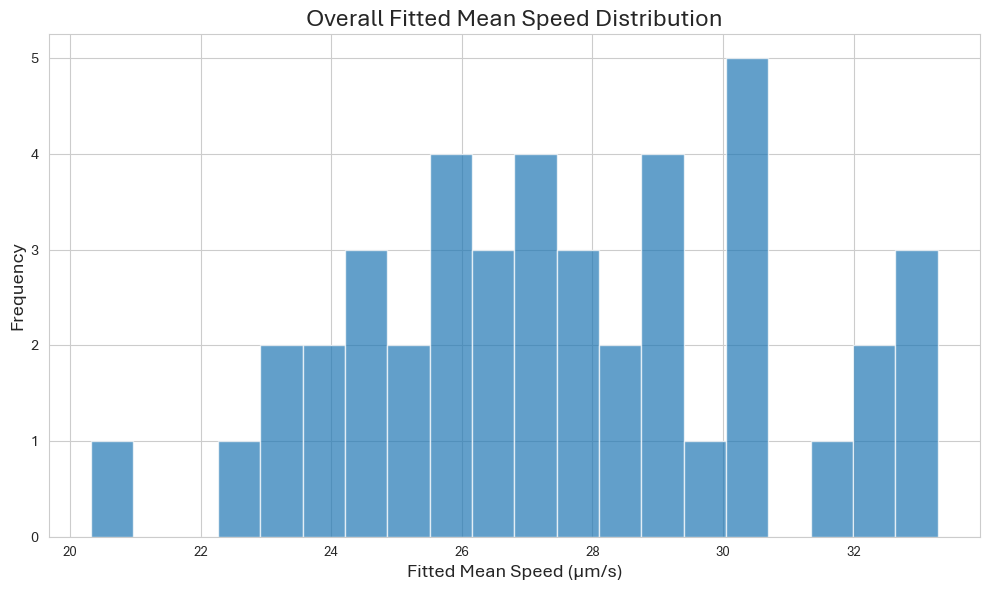

Fitted mean speeds saved to ././02_Outputs/05_Basic_Stats/01_Fitted_Mean_Speed_Distribution.csv


In [90]:
# plot the overall mean speed distribution
stats_advanced.plot_overall_mean_speed_distribution(
    bins=20,
    speed_unit="scale_units/s",  # Uses the same Capture scale unit as above
    title=None,                 # None = default; "" = no title
    title_fontsize=18,
    x_axis_fontsize=14,
    y_axis_fontsize=14,
    x_tick_fontsize=10,
    y_tick_fontsize=11,
    font_family="Aptos",
    dpi=300,
    save_plots=True,
    save_plot_path=Path("./02_Outputs/05_Basic_Stats/"),
    file_extension="png",       # "png" or "tif"
    )

# Save the mean speeds to a CSV file
stats_advanced.save_mean_speeds(
    filename="./02_Outputs/05_Basic_Stats/01_Fitted_Mean_Speed_Distribution",
    include_details=True, # Include source dataframe, particle ID, and speed unit columns. False preserves the original one-column mean_speed CSV format
    )


# Step 7: Additional Analyses — Advanced Tracker

The two rough additional-analysis notebooks have been consolidated into the following `Stats` workflows:

- **Particle characteristics:** per-track axis lengths, aspect ratio, area, path length, and speed summaries.
- **Trajectories from origin:** all or selected tracks shifted to a common starting point using capture scale metadata.
- **Turn analysis:** Savitzky-Golay smoothing, RDP path simplification, signed turn angles, per-particle turn rates, and trajectory/angle plots.
- **Run-and-tumble analysis:** a 2D adaptation of Turner et al. (2016), with paper-aligned moving-average smoothing, five-point velocities, run/tumble event classification, and per-particle/population summaries.
- **Speed-feature correlation:** per-particle feature means (for example area) compared with frame-aware mean speed.
- **Mean squared displacement:** individual and ensemble MSD with an explicitly reported log-log slope, alpha.

All analyses below use the dataframe already selected by `stats_advanced` and automatically use the Capture FPS, pixel scale factor, and scale units.

## 7.0: Universal Analysis Settings

### 7.0.1: Turn, Tumble, and Run Analysis Parameters

In [91]:
# Set the smoothing method and parameters for Turn, Angle-Based Tumble, and Velocity-Based Tumble calculations. The smoothing method can be "moving_average", "triangular_smoothing", or "sg_filter_rdp". The parameters are used only with the selected smoothing method.
smoothing_method="triangular_smoothing"  # "moving_average", "triangular_smoothing", or "sg_filter_rdp"
moving_average_window=7  # Odd span; used only with smoothing_method="moving_average"; Default for Turner paper; reports spans from 3 through 9 points
triangular_smoothing_window=7  # Used only with smoothing_method="triangular_smoothing"; Default for Najafi; # Selected triangular window for 30 fps ~9 (Najafi used 17 for 60 fps)
sg_filter_window_length=7  # Odd Savitzky-Golay window; used only with "sg_filter_rdp"; Default for MiMoSA
sg_filter_polyorder=5  # Savitzky-Golay polynomial order; used only with "sg_filter_rdp"
rdp_epsilon_pixels=5  # RDP tolerance in pixels; used only with "sg_filter_rdp"
distance_unit="scale_units" # Uses the Capture scale unit
max_frame_gap=1  # Largest accepted adjacent frame-number difference; 1 requires consecutive frames, while 2 permits one missing frame.
discard_initial_frames=10  # Remove detections in first 10-frame window
discard_final_frames=10  # Remove detections in final 10-frame window


### 7.0.2: Turn Metrics per Particle Plot Parameters

In [92]:
# Plotting Parameters for Per Particle Metrics
stats_advanced.set_particle_metric_plotting_parameters(
    title=None,  # None = metric title; "" = no displayed title
    title_fontsize=18,
    x_axis_fontsize=14,
    y_axis_fontsize=14,
    x_tick_fontsize=9,
    y_tick_fontsize=11,
    show_particle_ID=True,
    show_particle_ID_only_with_value=True,
    particle_ID_spacing=1, # None = no spacing; 1 = every particle; 2 = every other particle, etc.
    y_tick_spacing=1,
    font_family='Aptos',
    dpi=300,
    save_plots=True,
    save_plot_path=Path('./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/'),
    file_extension='png',
)


### 7.0.3: Analysis Plot Parameters

In [93]:
# Plotting Parameters for Analyses
stats_advanced.set_analysis_plotting_parameters(
    particle_marker=None, # None = no marker on the track; supported markers include 'o', 's', '^', 'D', and 'x'
    track_thickness=1.5,
    crop_to_track=False,

    angle_mode="absolute",
    show_turns=True,
    turn_color="#FF0000",
    turn_display_mode="markers",  # "markers" or exact observed-track "segments"
    turn_marker="o",  # Marker for turn events; supported markers include 'o', 's', '^', 'D', and 'x'
    segment_marker_thickness=1,
    marker_fill_mode="outline", # None (default), "solid", "outline"
    
    show_smoothed_trajectory=True,
    smoothed_trajectory_color="#1DB1C1",
    smooth_trajectory_thickness=1.0,

    show_tumbles=True,
    tumble_color="#D55E00",
    tumble_display_mode="Markers", # Marker for tumble events; supported markers include 'o', 's', '^', 'D', and 'x'
    tumble_marker="o",
    
    show_angle_smoothed_trajectory=False,
    smoothed_angle_trajectory_color="goldenrod",

    show_velocity_smoothed_trajectory=False,
    smoothed_velocity_trajectory_color="goldenrod",

    title=None,  # None = default title; "" = no displayed title
    title_fontsize=18,
    x_axis_fontsize=14,
    y_axis_fontsize=14,
    x_tick_fontsize=9,
    y_tick_fontsize=11,

    font_family='Aptos',
    dpi=300,
    save_plots=False,
    save_plot_path=Path('./02_Outputs/06_Additional_Analysis/01_Plots/02_Analysis_Plots/'),
    file_extension='png',
)


## 7.1: Particle Characteristics

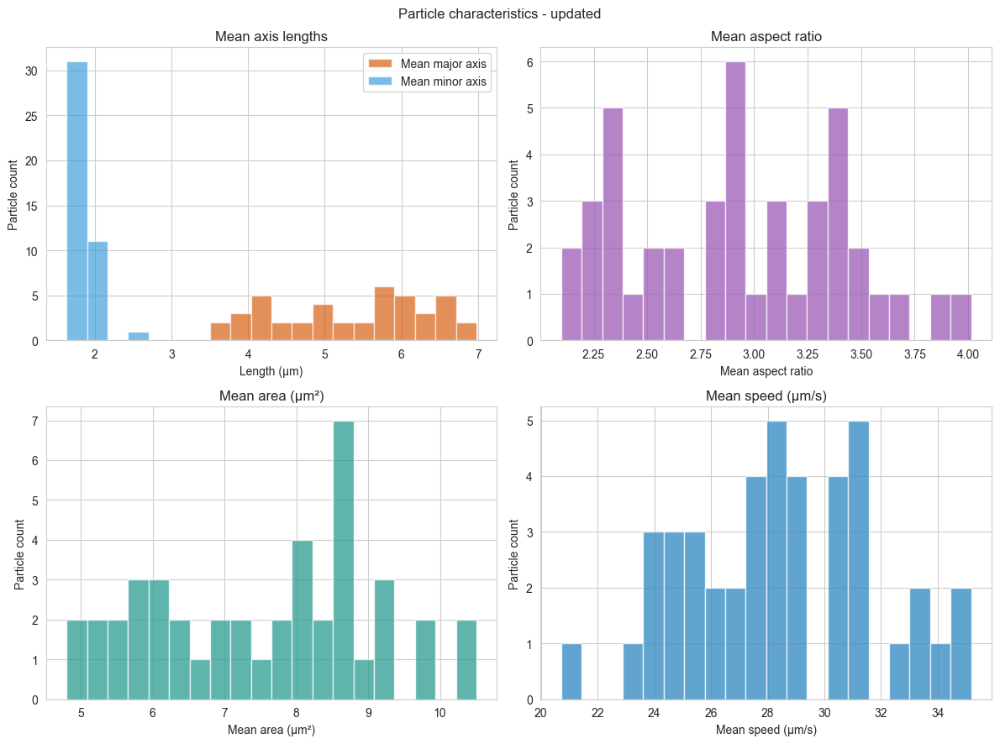

,strain,source_dataframe,particle,first_frame,last_frame,detection_count,frame_span,frame_span_duration_seconds,observed_duration_seconds,mean_major_axis_length,...,mean_speed,mean_interval_speed,median_speed,std_speed,total_path_length,length_unit,area_unit,speed_unit,discard_initial_frames,discard_final_frames
0,Strain_A,updated,0,11,90,78,79,2.793603,2.793603,6.266828,...,30.231600,30.255362,29.141647,8.216909,84.455099,um,um²,um/s,10,10
1,Strain_A,updated,4,11,90,80,79,2.793603,2.793603,6.528390,...,28.364670,28.364670,26.950311,8.033527,79.239638,um,um²,um/s,10,10
2,Strain_A,updated,7,11,90,80,79,2.793603,2.793603,4.028100,...,32.607464,32.607464,31.109833,8.367652,91.092321,um,um²,um/s,10,10
3,Strain_A,updated,8,11,78,68,67,2.369259,2.369259,6.826602,...,30.139051,30.139051,28.130309,8.060459,71.407204,um,um²,um/s,10,10
4,Strain_A,updated,11,11,70,60,59,2.086362,2.086362,5.940183,...,24.293032,24.293032,22.855365,11.532046,50.684059,um,um²,um/s,10,10


In [94]:
# Calculate one morphology and motion summary row per tracked particle
particle_characteristics_df = stats_advanced.calculate_particle_characteristics(
    length_unit="scale_units",  # "pixels" or "scale_units"
    speed_unit="scale_units/s",  # Automatically uses the Capture scale
    max_frame_gap=30,  # Exclude intervals that bridge missing detections
    discard_initial_frames=10,  # Remove detections in first 10-frame window
    discard_final_frames=10,  # Remove detections in final 10-frame window
    )

stats_advanced.plot_particle_characteristic_distributions(bins=20)
display(particle_characteristics_df.head())


## 7.2: Track from Origin

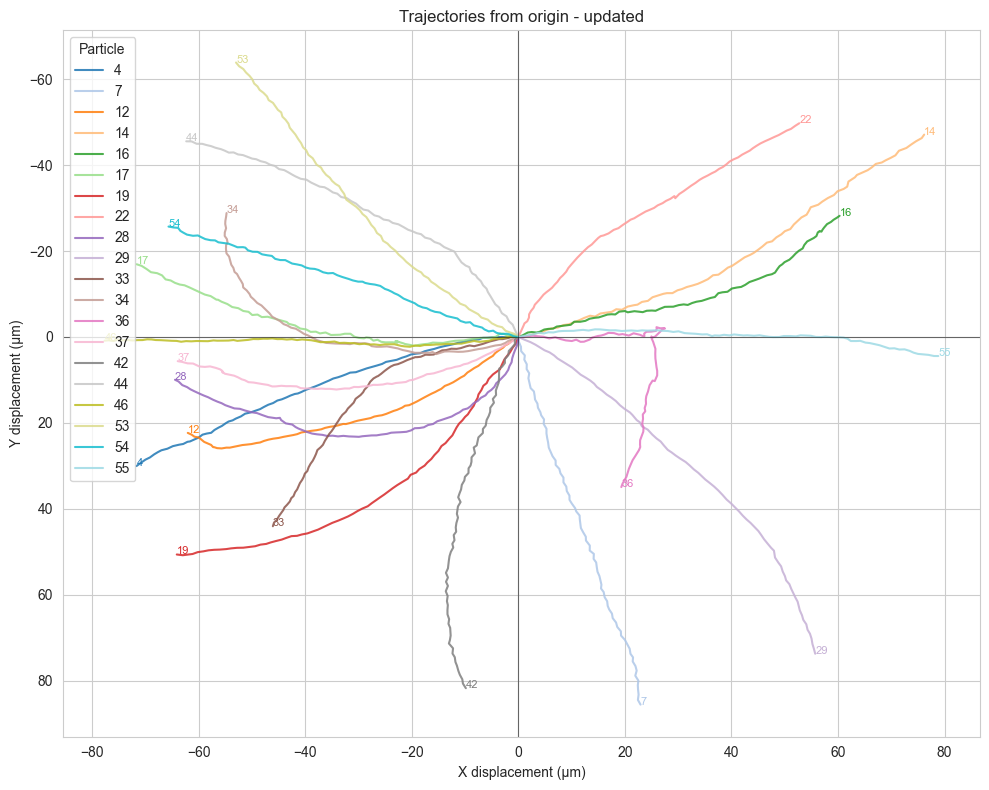

(<Figure size 1000x800 with 1 Axes>,
 <Axes: title={'center': 'Trajectories from origin - updated'}, xlabel='X displacement (μm)', ylabel='Y displacement (μm)'>)

In [96]:
# Plot a manageable selection of the longest tracks from a common origin
trajectory_particles = (
    particle_characteristics_df
    .nlargest(20, "detection_count")["particle"]
    .astype(int)
    .tolist()
    )

# Plot
stats_advanced.plot_trajectories_from_origin(
    particle_ids=trajectory_particles,
    distance_unit="scale_units",
    show_particle_ids=True,
    discard_initial_frames=10,  # Remove detections in first 10-frame window
    discard_final_frames=10,  # Remove detections in final 10-frame window
    )


## 7.3: Turn Analysis
Turn angles are measured after the selected smoother. `moving_average` and `triangular_smoothing` retain processed trajectory points, while `sg_filter_rdp` applies the SG filter followed by sparse RDP. A track is split when detections are separated by more than `max_frame_gap`, preventing long missing-frame gaps from creating artificial turns. The returned angle dataframe contains all measurable processed-path angles; rows where `is_turn` is `True` are detected turn points. Consecutive qualifying points are not merged, so counts can differ across smoothing methods.

### 7.3.1: Calculate Turn Angles

In [97]:
# Set the minimum turn angle threshold in degrees for calculating turn angles
minimum_turn_angle_degrees=35 # The default is 30 degrees, but you can adjust this value to capture smaller or larger turns as needed.

# Calculate Turn Angles and Statistics
turn_summary_df, turn_angles_df = stats_advanced.calculate_turn_statistics(
    minimum_turn_angle_degrees=minimum_turn_angle_degrees,
    smoothing_method=smoothing_method,
    moving_average_window=moving_average_window,
    triangular_smoothing_window=triangular_smoothing_window,
    sg_filter_window_length=sg_filter_window_length, 
    sg_filter_polyorder=sg_filter_polyorder,
    rdp_epsilon_pixels=rdp_epsilon_pixels,
    distance_unit=distance_unit,
    max_frame_gap=max_frame_gap,
    discard_initial_frames=discard_initial_frames,
    discard_final_frames=discard_final_frames,
    )
turn_events_df = stats_advanced.get_turn_events_dataframe()

display(turn_summary_df.head())
display(turn_events_df.head())


Analyzing turns: 100%|██████████| 43/43 [00:00<00:00, 632.47it/s]


,strain,source_dataframe,particle,first_frame,last_frame,detection_count,segment_count,processed_point_count,angle_count,number_of_turns,...,minimum_turn_angle_degrees,smoothing_method,moving_average_window,triangular_smoothing_window,sg_filter_window_length,sg_filter_polyorder,rdp_epsilon_pixels,max_frame_gap,discard_initial_frames,discard_final_frames
0,Strain_A,updated,0,11,90,78,3,78,72,0,...,35,triangular_smoothing,NaN,7,NaN,NaN,NaN,1,10,10
1,Strain_A,updated,4,11,90,80,1,80,78,0,...,35,triangular_smoothing,NaN,7,NaN,NaN,NaN,1,10,10
2,Strain_A,updated,7,11,90,80,1,80,78,0,...,35,triangular_smoothing,NaN,7,NaN,NaN,NaN,1,10,10
3,Strain_A,updated,8,11,78,68,1,68,66,0,...,35,triangular_smoothing,NaN,7,NaN,NaN,NaN,1,10,10
4,Strain_A,updated,11,11,70,60,1,60,58,0,...,35,triangular_smoothing,NaN,7,NaN,NaN,NaN,1,10,10


,strain,source_dataframe,particle,segment_id,processed_vertex_index,frame,elapsed_time_seconds,centroid_x_pixels,centroid_y_pixels,turn_angle_degrees,absolute_turn_angle_degrees,is_turn,cumulative_distance,distance_unit,smoothing_method,effective_smoothing_window
0,Strain_A,updated,36,1,35,46,1.237672,956.440171,742.192308,-43.179873,43.179873,True,27.089417,um,triangular_smoothing,7
1,Strain_A,updated,36,1,36,47,1.273034,956.908714,743.286307,-65.064959,65.064959,True,27.267929,um,triangular_smoothing,7
2,Strain_A,updated,41,1,44,55,1.555931,1463.114206,1938.320334,-104.681535,104.681535,True,50.026333,um,triangular_smoothing,7
3,Strain_A,updated,41,1,45,56,1.591293,1460.148148,1939.407407,-88.860004,88.860004,True,50.078490,um,triangular_smoothing,7
4,Strain_A,updated,41,1,46,57,1.626655,1458.687151,1937.879888,-66.053319,66.053319,True,50.146210,um,triangular_smoothing,7


### 7.3.2: Plot Turn Angle Statistics

#### 7.3.2.1: Plot Turn Angle Distribution

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/01_Absolute turn angle (degrees).png


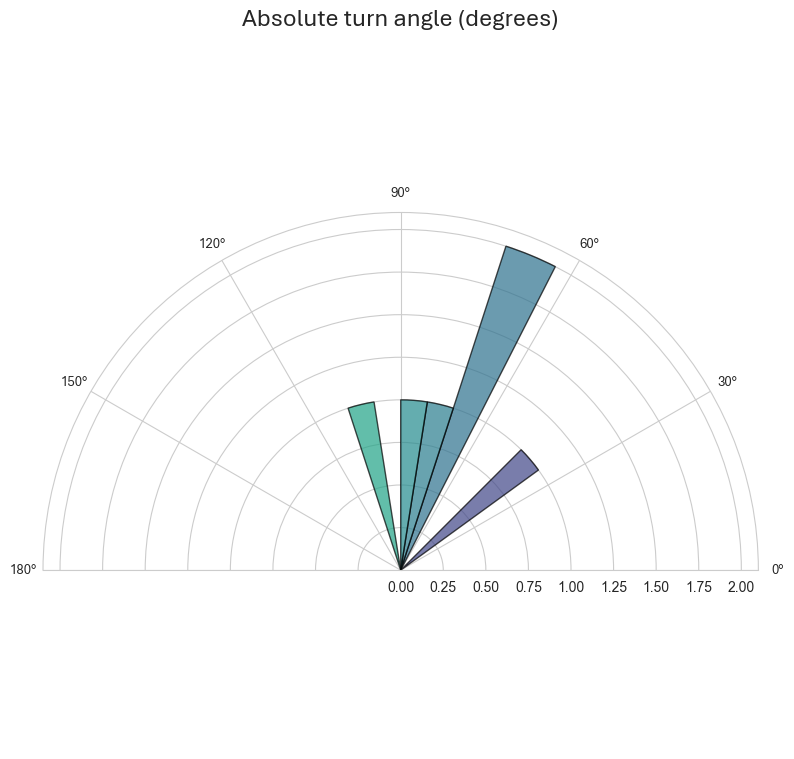

In [98]:
# Aggregate turn-angle and particle turn-rate plots

# Plot Turn Angle Distribution
_, _, turn_angle_bins_df = stats_advanced.plot_turn_angle_distribution(
    bins=20,
    turns_only=True,
    angle_mode="absolute",
    plot_style="polar",
    color="viridis", # None, color, or colormap

    title=None, # None = default; "" = no title
    title_fontsize=18,
    #x_axis_fontsize=14,
    #y_axis_fontsize=14,
    #x_tick_fontsize=10,
    #y_tick_fontsize=11,
    font_family="Aptos",

    figsize=(8,8),
    dpi=300,
    save_plots=True,
    save_plot_path=Path('./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/'),
    file_extension="png"
    )


#### 7.3.2.2: Plot Number of Turns per Particle

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/02_Number of turns.png


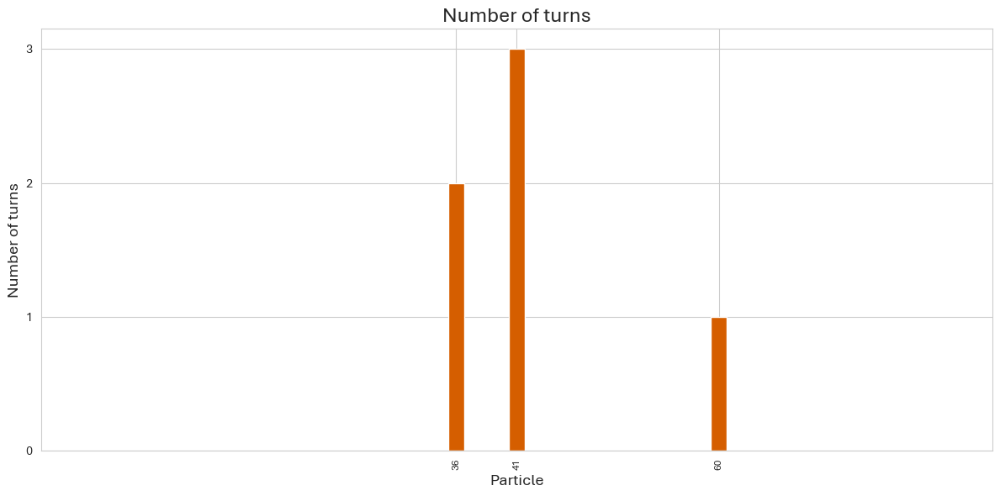

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Number of turns'}, xlabel='Particle', ylabel='Number of turns'>)

In [99]:
# Plot Number of Turns per Particle
stats_advanced.plot_particle_turn_metric(
    metric="number_of_turns", #"turns_per_distance", # Valid Metrics 'number_of_turns', 'turns_per_distance', 'turns_per_second'
    plot_style="bar", # "bar" or "polar"
    show_particle_ID=True,
    color='#D55E00', # Can also use colormaps
    figsize=(12,6)
    )


#### 7.3.2.3: Plot Turn per Distance per Particle

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/03_Turns per μm.png


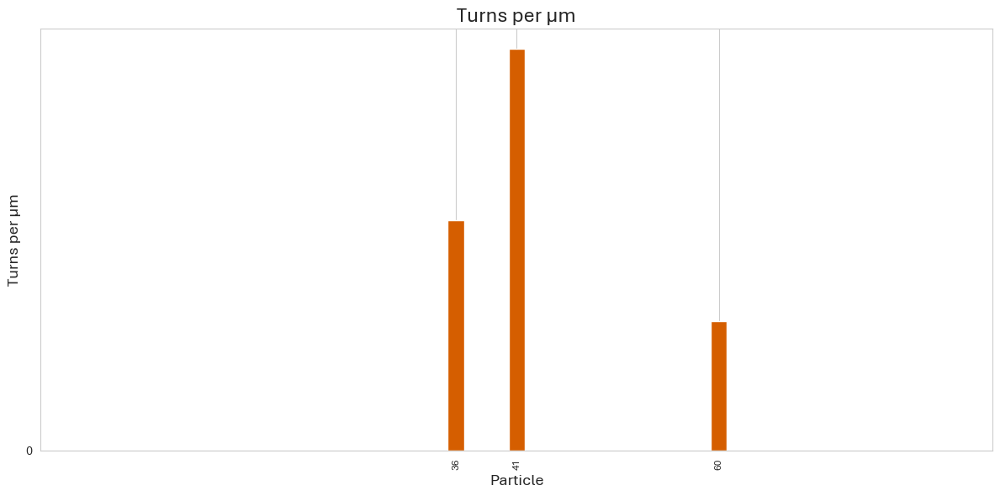

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Turns per μm'}, xlabel='Particle', ylabel='Turns per μm'>)

In [100]:
# Plot Turn per Distance per Particle
stats_advanced.plot_particle_turn_metric(
    metric="turns_per_distance", #"turns_per_distance", # Valid Metrics 'number_of_turns', 'turns_per_distance', 'turns_per_second'
    plot_style="bar", # "bar" or "polar"
    show_particle_ID=True,
    color='#D55E00', # Can also use colormaps
    figsize=(12,6)
    )


#### 7.3.2.4: Plot Turns per Second per Particle

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/04_Turns per second.png


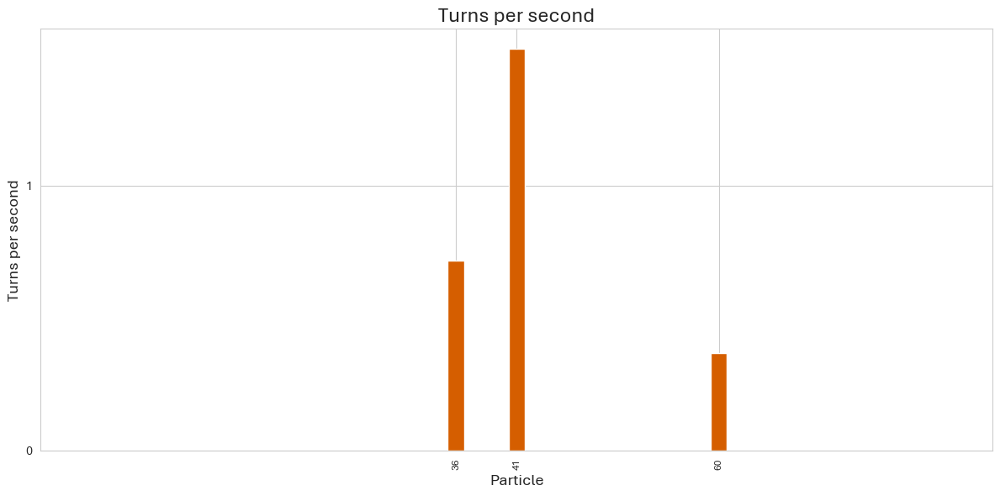

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Turns per second'}, xlabel='Particle', ylabel='Turns per second'>)

In [101]:
# Plot Turns per Second per Particle
stats_advanced.plot_particle_turn_metric(
    metric="turns_per_second", #"turns_per_distance", # Valid Metrics 'number_of_turns', 'turns_per_distance', 'turns_per_second'
    plot_style="bar", # "bar" or "polar"
    show_particle_ID=True,
    color='#D55E00', # Can also use colormaps
    figsize=(12,6)
    )


#### 7.3.2.5: Plot Turn Analysis per Selected Particle (Default = Highest Turn Count)

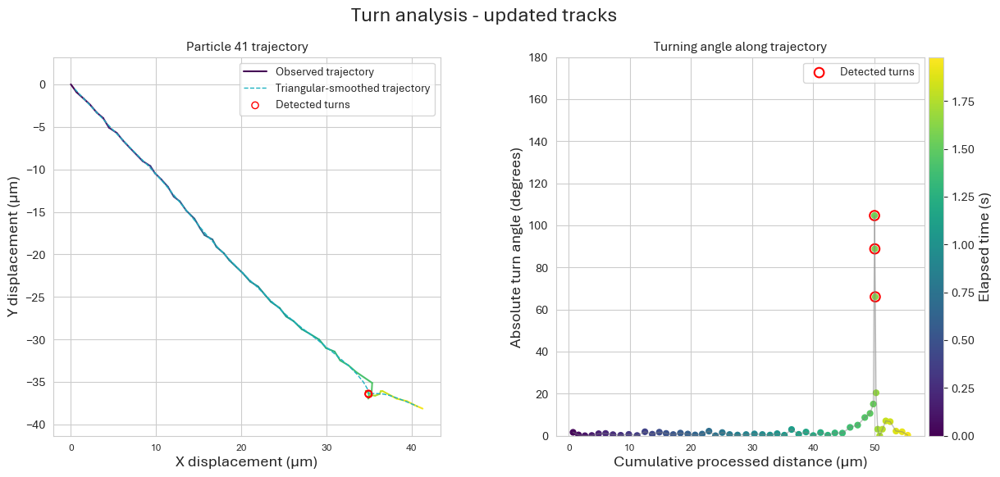

In [102]:
# Review the particle with the largest detected turn count
particles_with_tumbles = turn_summary_df.loc[turn_summary_df["number_of_turns"] > 0]

if not particles_with_tumbles.empty:
    particle_to_review = int(particles_with_tumbles.nlargest(1, "number_of_turns")["particle"].iloc[0])

    # Plot Turn Analysis for Selected Particle (Default = Highest Turn Count)
    stats_advanced.plot_particle_turn_analysis(
        particle_id=particle_to_review,
        figsize=(14,6),
        )
else:
    particle_to_review = None
    print("No particles have more than 0 turns.")


#### 7.3.2.6: Plot Turn Analysis per Selected Particle (ALL)

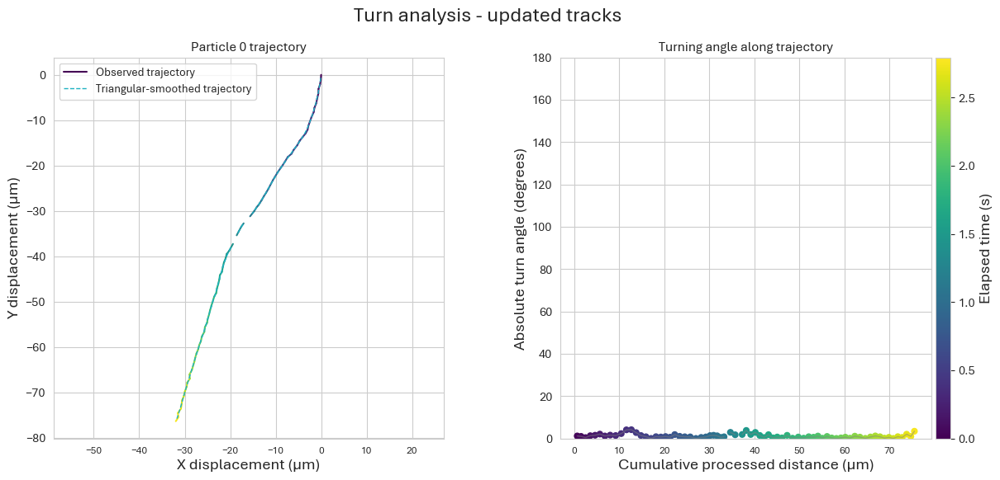

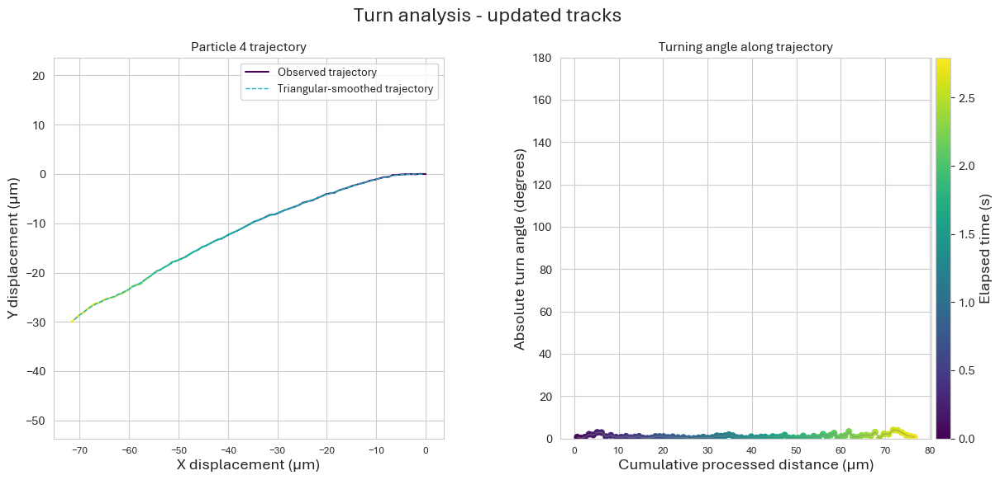

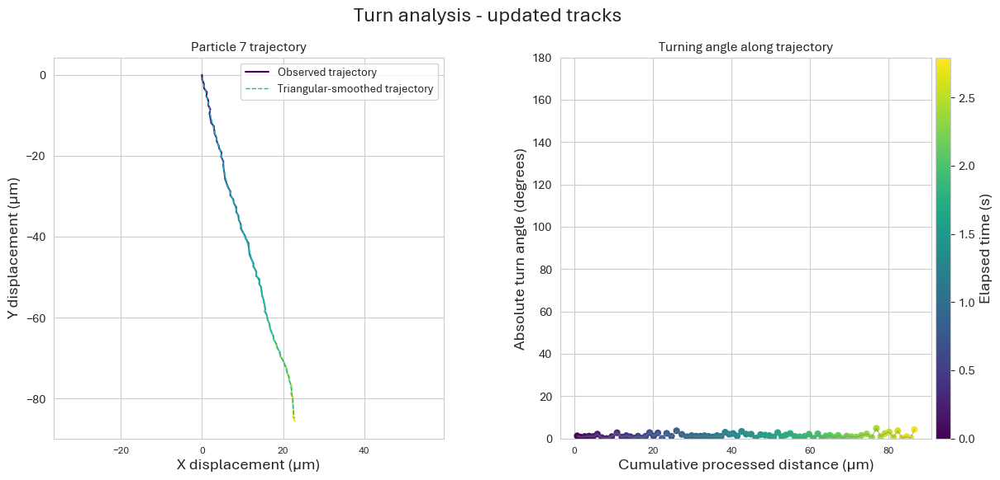

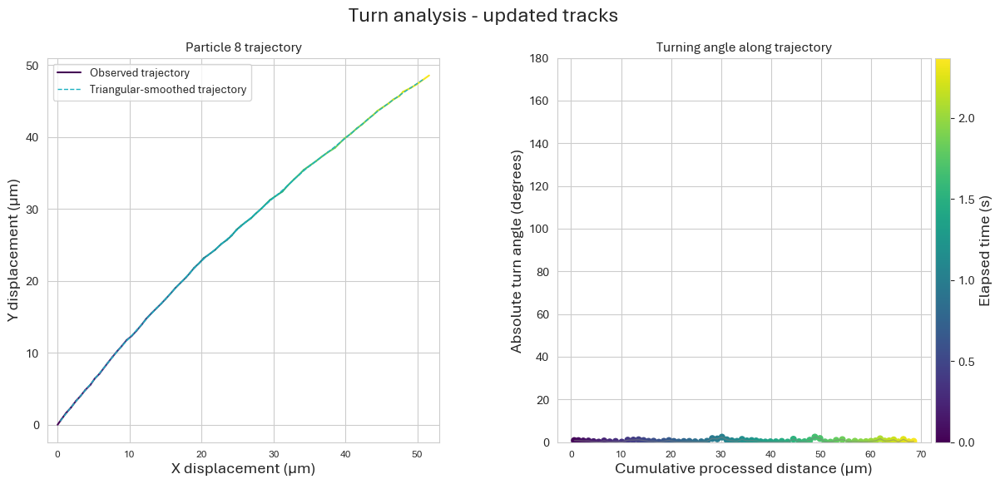

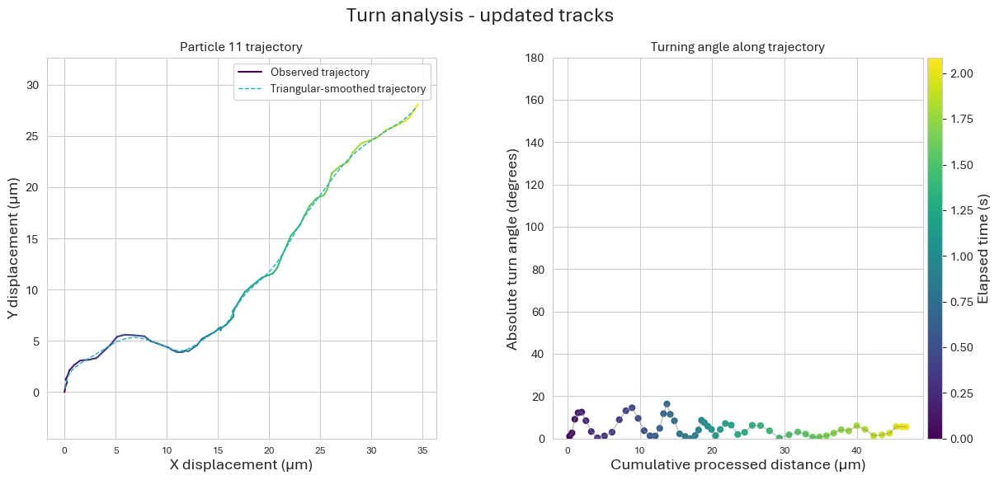

...

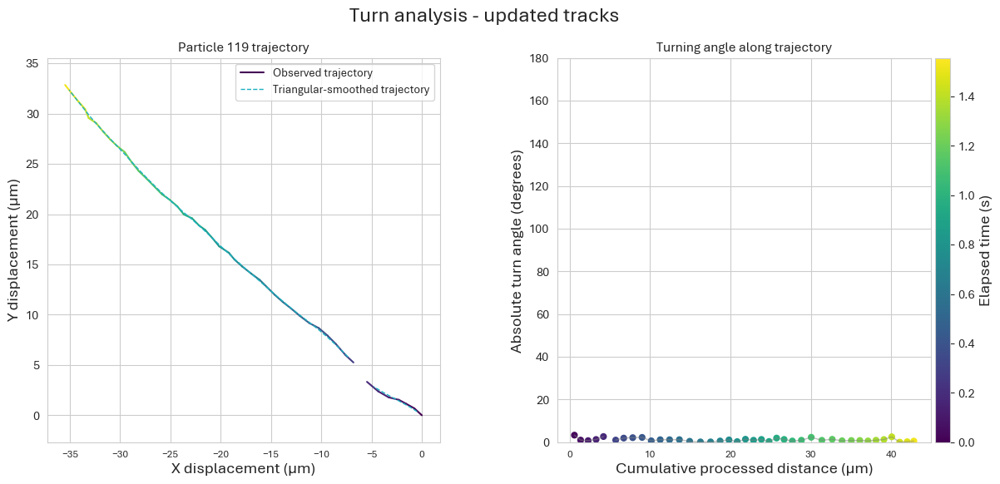

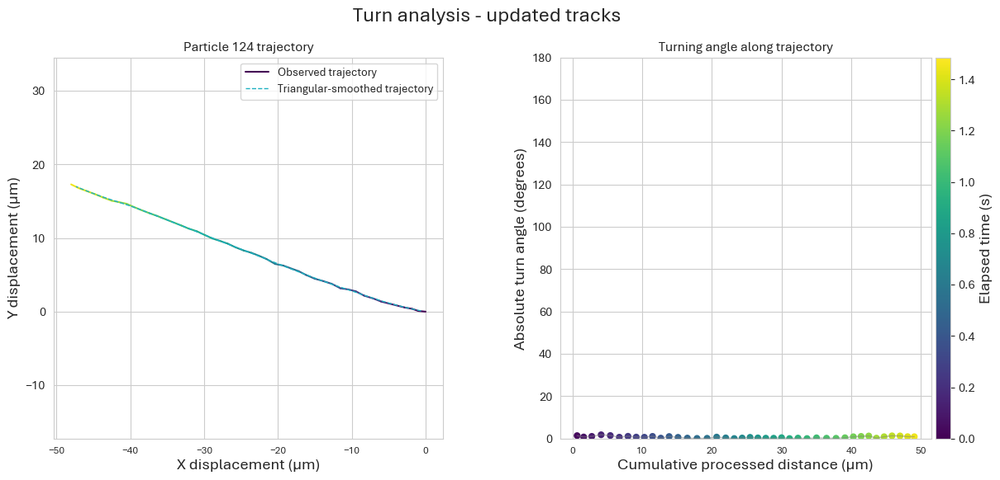

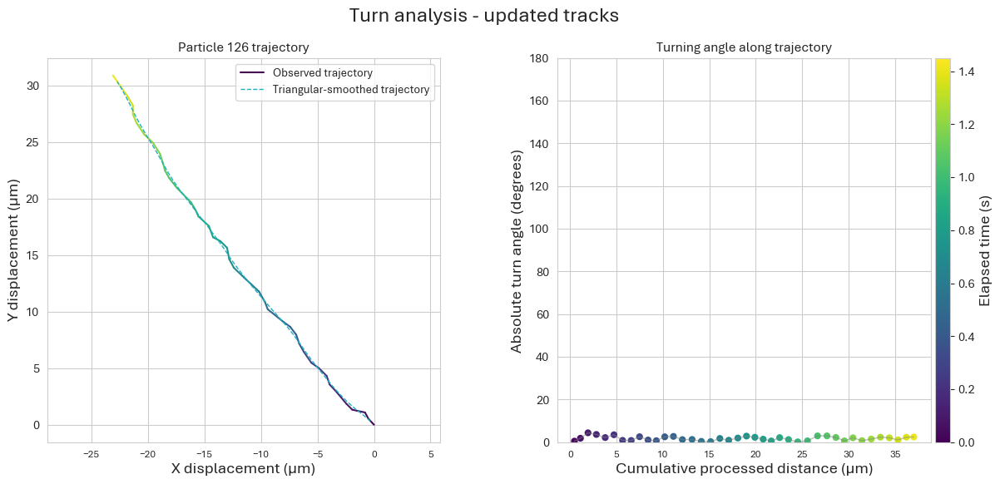

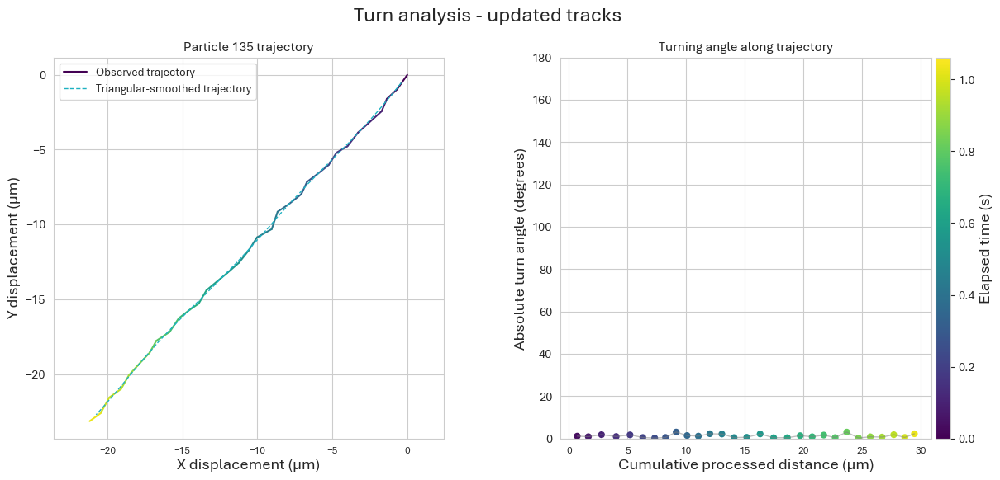

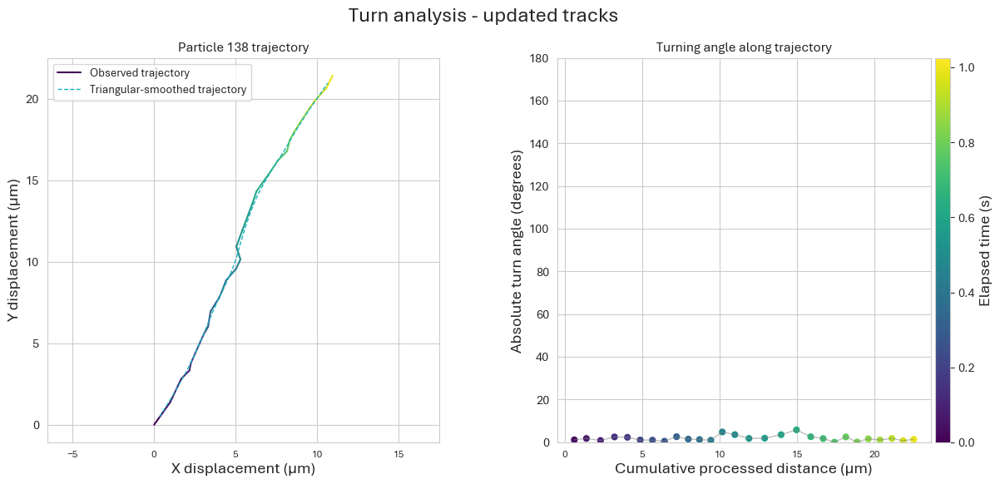

In [103]:
# Plot Turn Analysis for All Available Particles
for particle_to_review in turn_summary_df["particle"].dropna().unique():
    stats_advanced.plot_particle_turn_analysis(
        particle_id=particle_to_review,
        figsize=(14,6),
        )

## 7.4: Angle-Based Tumble Analysis
This is a 2D adaptation of Turner et al., *Visualizing Flagella while Tracking Bacteria* (2016). By default, the analysis removes available detections whose frame numbers fall within the first and final 10-frame windows of each track. Because removal is based on frame-number ranges rather than row counts, sparsely detected tracks may lose fewer than 10 detections from either end. It then applies a centered five-point moving average, calculates velocity with the paper's five-point fourth-order central difference, classifies runs from at least three successive angles at or below 35 degrees, and classifies tumbles from at least two successive angles above 35 degrees (plus the paper's singleton confirmation test). Tracks are split across gaps larger than `max_frame_gap`.

`smoothing_method` accepts `"moving_average"`, `"triangular_smoothing"`, or `"sg_filter_rdp"`. The moving average is Turner-aligned; the other choices are alternative analyses. SG-filtered RDP vertices are reconstructed on the retained source-frame coordinates before the five-point derivatives and event classification.


### 7.4.1: Calculate Angle-Based Tumble Statistics

In [104]:
# Set the minimum turn angle threshold in degrees for calculating tumble events.
tumble_threshold_angle=35  # Paper default: 35 degrees per trajectory point

# Calculate Angle-Based Run-and-Tumble Statistics
(
    angle_tumble_summary_df,
    angle_tumble_events_df,
    angle_tumble_points_df,
    angle_tumble_population_df,
    angle_tumble_table_1_df,
) = stats_advanced.calculate_angle_tumble_statistics(
    tumble_threshold_angle=tumble_threshold_angle,
    smoothing_method=smoothing_method,
    moving_average_window=moving_average_window,
    triangular_smoothing_window=triangular_smoothing_window,
    sg_filter_window_length=sg_filter_window_length, 
    sg_filter_polyorder=sg_filter_polyorder,
    rdp_epsilon_pixels=rdp_epsilon_pixels,
    distance_unit=distance_unit,
    max_frame_gap=max_frame_gap,
    discard_initial_frames=discard_initial_frames,
    discard_final_frames=discard_final_frames,
    )

display(angle_tumble_table_1_df)
display(angle_tumble_population_df)
display(angle_tumble_summary_df.head())
display(angle_tumble_events_df.head())


Classifying runs and tumbles: 100%|██████████| 43/43 [00:00<00:00, 375.07it/s]


,strain,Parameter,Value
0,Strain_A,Number of cells,43
1,Strain_A,Number of cells that tumbled,2
2,Strain_A,Run speed (um/s),27.43071
3,Strain_A,±std,3.714165
4,Strain_A,±sem,0.566405
5,Strain_A,Tumble speed (um/s),5.029716
6,Strain_A,±std,1.214815
7,Strain_A,±sem,0.859004
8,Strain_A,Angular speed while running (°/point),1.935536
9,Strain_A,±std,1.51736


,strain,source_dataframe,particle_count,particles_with_analyzable_angles,particles_with_tumbles,total_number_of_runs,total_number_of_tumbles,total_analyzed_tracking_time_seconds,mean_tumble_frequency_per_second,std_tumble_frequency_per_second,...,smoothing_method,moving_average_window,triangular_smoothing_window,sg_filter_window_length,sg_filter_polyorder,rdp_epsilon_pixels,discard_initial_frames,discard_final_frames,tumble_threshold_angle_degrees,max_frame_gap
0,Strain_A,updated,43,43,2,51,2,100.534359,0.020068,0.093328,...,triangular_smoothing,NaN,7,NaN,NaN,NaN,10,10,35.0,1


,strain,source_dataframe,particle,original_first_frame,original_last_frame,original_detection_count,discarded_detection_count,analyzed_first_frame,analyzed_last_frame,analyzed_detection_count,...,moving_average_window,triangular_smoothing_window,sg_filter_window_length,sg_filter_polyorder,rdp_epsilon_pixels,discard_initial_frames,discard_final_frames,tumble_threshold_angle_degrees,max_frame_gap,analysis_status
0,Strain_A,updated,0,1,100,98,20,11,90,78,...,NaN,7,NaN,NaN,NaN,10,10,35.0,1,complete
1,Strain_A,updated,4,1,100,100,20,11,90,80,...,NaN,7,NaN,NaN,NaN,10,10,35.0,1,complete
2,Strain_A,updated,7,1,100,100,20,11,90,80,...,NaN,7,NaN,NaN,NaN,10,10,35.0,1,complete
3,Strain_A,updated,8,1,88,88,20,11,78,68,...,NaN,7,NaN,NaN,NaN,10,10,35.0,1,complete
4,Strain_A,updated,11,1,80,80,20,11,70,60,...,NaN,7,NaN,NaN,NaN,10,10,35.0,1,complete


,strain,source_dataframe,particle,segment_id,event_id,event_type,start_frame,end_frame,support_end_frame,point_count,...,std_angular_speed_degrees_per_point,direction_change_within_run_degrees,run_to_run_direction_change_degrees,preceding_run_event_id,following_run_event_id,distance_unit,speed_unit,smoothing_method,effective_smoothing_window,tumble_threshold_angle_degrees
0,Strain_A,updated,0,1,1,run,13,41,42,29,...,0.989344,22.486718,NaN,<NA>,<NA>,um,um/s,triangular_smoothing,7,35.0
1,Strain_A,updated,0,3,2,run,53,87,88,35,...,0.661886,5.383893,NaN,<NA>,<NA>,um,um/s,triangular_smoothing,7,35.0
2,Strain_A,updated,4,1,1,run,13,87,88,75,...,0.866312,33.022149,NaN,<NA>,<NA>,um,um/s,triangular_smoothing,7,35.0
3,Strain_A,updated,7,1,1,run,13,87,88,75,...,0.871249,9.203251,NaN,<NA>,<NA>,um,um/s,triangular_smoothing,7,35.0
4,Strain_A,updated,8,1,1,run,13,75,76,63,...,0.540875,16.089459,NaN,<NA>,<NA>,um,um/s,triangular_smoothing,7,35.0


### 7.4.2: Plot Angle-Based Tumble Statistics

#### 7.4.2.1: Plot Angle-Based Tumbles per Particle

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/05_Number of tumbles.png


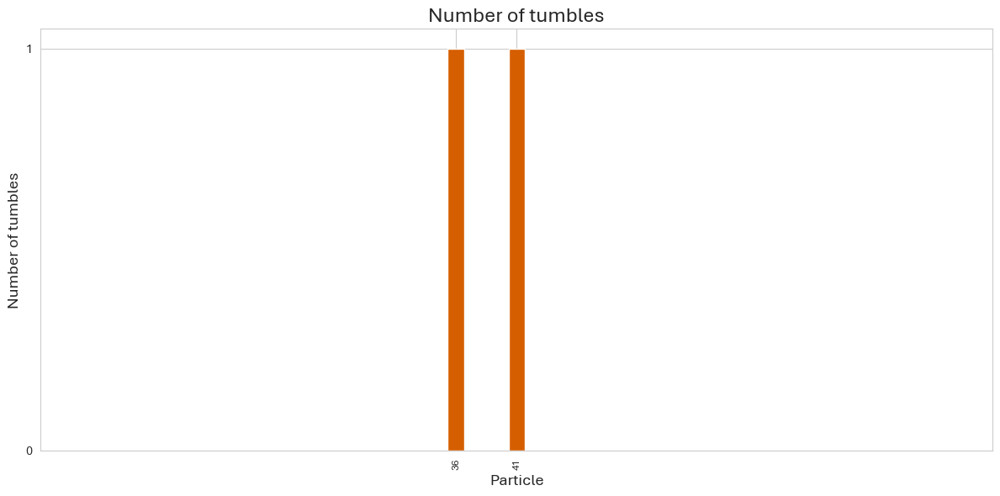

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Number of tumbles'}, xlabel='Particle', ylabel='Number of tumbles'>)

In [105]:
# Plot Number of Angle-Based Tumbles per Particle
stats_advanced.plot_particle_angle_tumble_metric(
    metric="number_of_tumbles",
    plot_style="bar", # "bar" or "polar"
    show_particle_ID=True,
    color='#D55E00', # Can also use colormaps
    figsize=(12,6)
    )


#### 7.4.2.2: Plot Angle-Based Tumble Analysis per Selected Particle (Default = Highest Tumble Count)

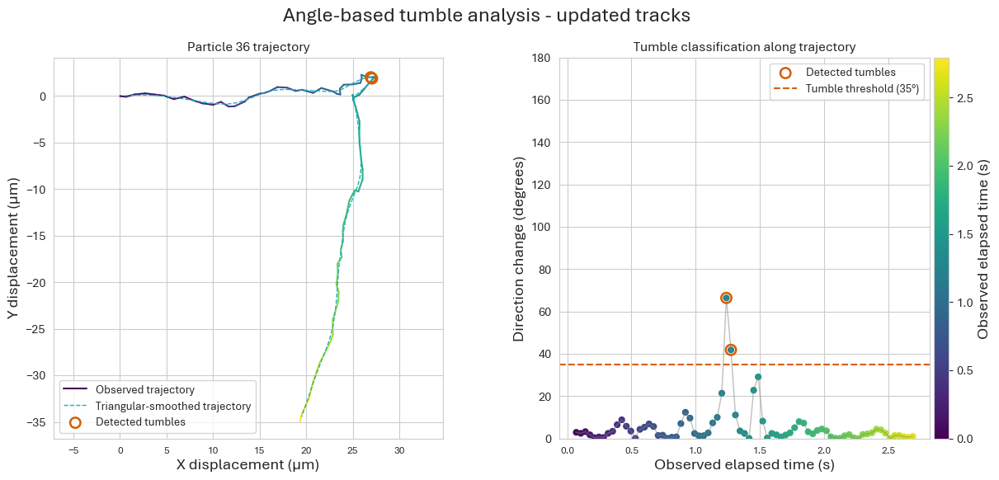

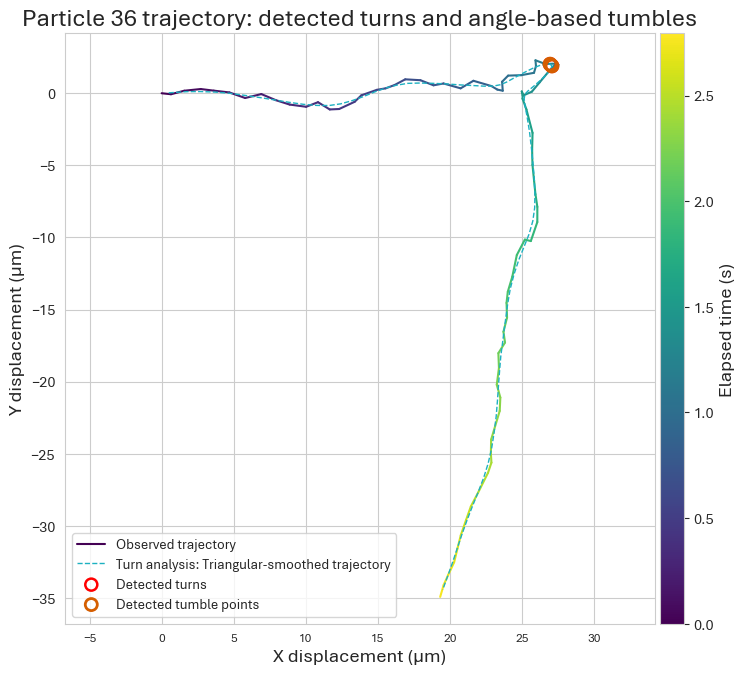

In [106]:
# Review the particle with the largest detected tumble count
particles_with_tumbles = angle_tumble_summary_df.loc[angle_tumble_summary_df["number_of_tumbles"] > 0]

if not particles_with_tumbles.empty:
    particle_to_review = int(particles_with_tumbles.nlargest(1, "number_of_tumbles")["particle"].iloc[0])

    # Plot Angle-Based Tumble Analysis for a Selected Particle (Default = Highest Turn Count)
    stats_advanced.plot_particle_angle_tumble_analysis(
        particle_id=particle_to_review,
        figsize=(14,6)
        )

    # Plot Combined Turn and Angle-Based Tumble Analysis for a Selected Particle (Default = Highest Turn Count)
    stats_advanced.plot_particle_turn_angle_tumble_analysis(
        particle_id=particle_to_review,
        figsize=(7,7)
        )
else:
    particle_to_review = None
    print("No particles have more than 0 tumbles.")


#### 7.4.2.3: Plot Angle-Based Tumble Analysis per Selected Particle (ALL Tumble Positive Tracks)

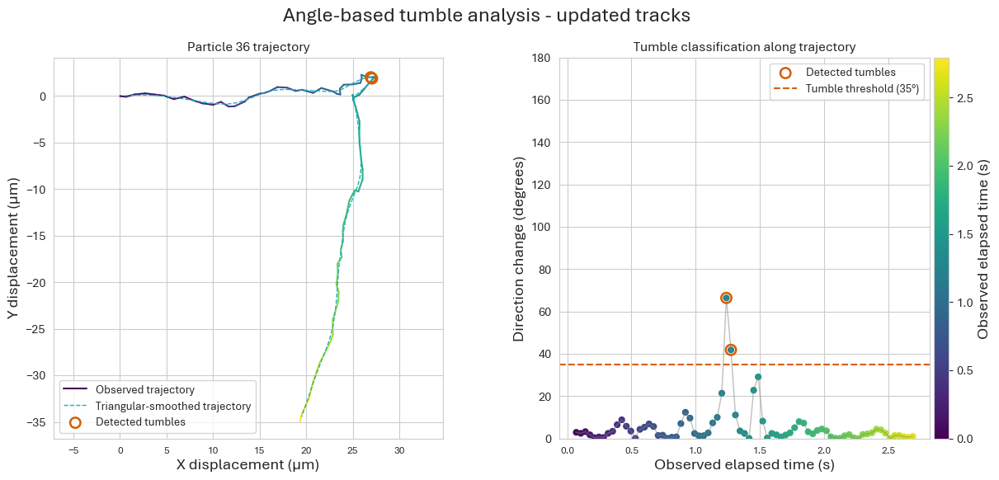

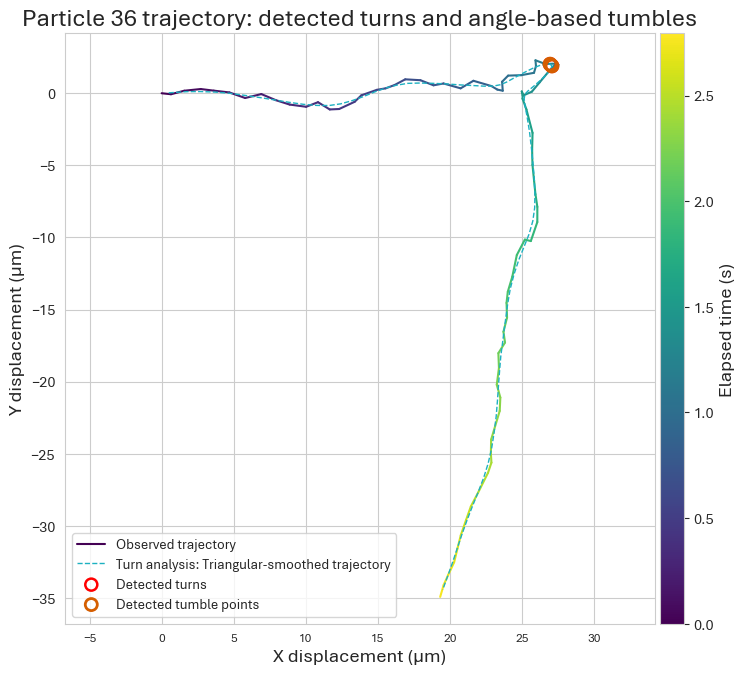

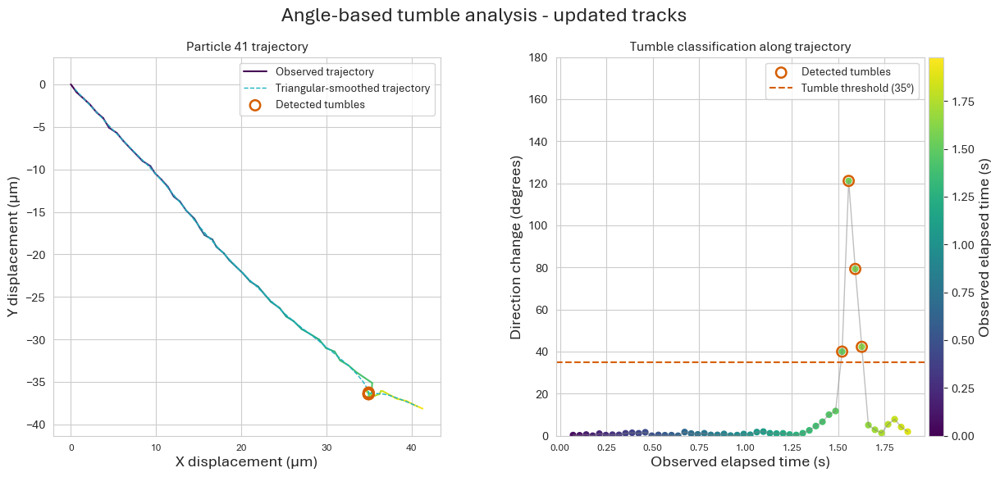

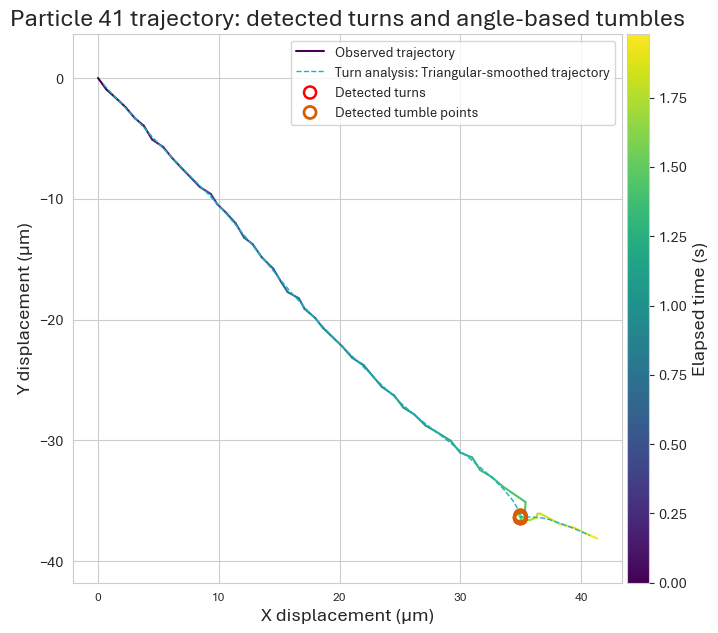

In [107]:
# Plot Angle-Based Turn Analysis & Combined Turn and Angle-Based Tumble Analysis for All Tumble Positive Available Particles
for particle_to_review in (angle_tumble_summary_df.loc[angle_tumble_summary_df["number_of_tumbles"] > 0,"particle",].dropna().unique()):
    # Plot Angle-Based Turn Analysis
    stats_advanced.plot_particle_angle_tumble_analysis(
        particle_id=particle_to_review,
        )

    # Plot Combined Turn and Angle-Based Tumble Analysis
    stats_advanced.plot_particle_turn_angle_tumble_analysis(
        particle_id=particle_to_review,
        figsize=(7,7)
        )


## 7.5: Velocity-Based Tumble Analysis
Detect tumbles from coincident speed dips and angular-speed peaks. This implements the method in *Najafi et al., Science Advances 4 (2018), eaar6425*. `triangular_smoothing` is the Najafi-aligned default; `moving_average` and `sg_filter_rdp` are alternative analyses. Backward finite differences of the selected processed trajectory give velocity, speed, heading, and angular-velocity magnitude.


### 7.5.1: Calculate Velocity-Based Tumble Statistics

In [108]:
# Set the minimum heading speed threshold for calculating velocity-based tumble events.
minimum_heading_speed=None # This threshold is used to filter out low-speed movements that may not represent true directional changes.
persistence_interval_seconds=1/6
run_direction_fit_points=4

# Calculate Velocity-Based Run-and-Tumble statistics
(
    velocity_tumble_summary_df,
    velocity_tumble_events_df,
    velocity_tumble_points_df,
    velocity_tumble_population_df,
    velocity_tumble_table_1_df,
) = stats_advanced.calculate_velocity_tumble_statistics(
    minimum_heading_speed=minimum_heading_speed,
    persistence_interval_seconds=persistence_interval_seconds,
    run_direction_fit_points=run_direction_fit_points,
    smoothing_method=smoothing_method,
    moving_average_window=moving_average_window,
    triangular_smoothing_window=triangular_smoothing_window,
    sg_filter_window_length=sg_filter_window_length, 
    sg_filter_polyorder=sg_filter_polyorder,
    rdp_epsilon_pixels=rdp_epsilon_pixels,
    distance_unit=distance_unit,
    max_frame_gap=max_frame_gap,
    discard_initial_frames=discard_initial_frames,
    discard_final_frames=discard_final_frames,
    )

display(velocity_tumble_table_1_df)
display(velocity_tumble_summary_df)
display(velocity_tumble_events_df)
display(velocity_tumble_points_df)
display(velocity_tumble_population_df)


Detecting velocity-based tumbles: 100%|██████████| 43/43 [00:00<00:00, 214.55it/s]


,strain,Parameter,Value
0,Strain_A,Strain,Strain_A
1,Strain_A,vR (um/s),27.431899
2,Strain_A,vT (um/s),15.143915
3,Strain_A,Mean tR (s),0.212172
4,Strain_A,±std,NaN
5,Strain_A,±sem,NaN
6,Strain_A,Mean tT (s),0.381125
7,Strain_A,p,0.990398
8,Strain_A,R,0.44215
9,Strain_A,Dr (rad²/s),0.083675


,strain,source_dataframe,particle,original_first_frame,original_last_frame,original_detection_count,discarded_detection_count,analyzed_first_frame,analyzed_last_frame,analyzed_detection_count,...,speed_period_depth_fraction,angular_change_coefficient,minimum_heading_speed,speed_extrema_prominence,angular_velocity_extrema_prominence,extrema_min_distance,persistence_interval_seconds,run_direction_fit_points,max_frame_gap,analysis_status
0,Strain_A,updated,0,1,100,98,20,11,90,78,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
1,Strain_A,updated,4,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
2,Strain_A,updated,7,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
3,Strain_A,updated,8,1,88,88,20,11,78,68,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
4,Strain_A,updated,11,1,80,80,20,11,70,60,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_with_tumbles
5,Strain_A,updated,12,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
6,Strain_A,updated,14,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
7,Strain_A,updated,15,1,100,96,20,11,90,76,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_with_tumbles
8,Strain_A,updated,16,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles
9,Strain_A,updated,17,1,100,100,20,11,90,80,...,0.2,0.8,None,None,None,1,0.166667,4,1,analyzed_no_tumbles


,strain,source_dataframe,particle,segment_id,event_id,event_type,start_frame,end_frame,support_start_frame,point_count,...,run_to_run_directional_cosine,distance_unit,speed_unit,angular_velocity_unit,smoothing_method,effective_smoothing_window,speed_drop_ratio_threshold,speed_period_depth_fraction,angular_change_coefficient,minimum_heading_speed
0,Strain_A,updated,11,1,1,tumble,29,44,28,16,...,0.438580,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
1,Strain_A,updated,15,3,1,tumble,35,43,34,9,...,0.200343,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
2,Strain_A,updated,32,2,1,tumble,78,87,77,10,...,NaN,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
3,Strain_A,updated,36,1,1,tumble,36,57,35,22,...,0.132637,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
4,Strain_A,updated,37,1,1,tumble,80,84,79,5,...,0.979116,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
5,Strain_A,updated,41,1,1,tumble,50,61,49,12,...,0.930657,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
6,Strain_A,updated,60,1,1,tumble,28,35,27,8,...,0.979659,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
7,Strain_A,updated,60,1,2,tumble,41,48,40,8,...,0.816378,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None
8,Strain_A,updated,70,1,1,tumble,31,46,30,16,...,-0.940167,um,um/s,rad/s,triangular_smoothing,7,0.7,0.2,0.8,None


,strain,source_dataframe,particle,segment_id,frame,previous_frame,frame_delta_from_previous,elapsed_time_from_previous_seconds,elapsed_time_seconds,raw_position_x_pixels,...,speed_minimum_passes,is_angular_velocity_maximum,angular_velocity_maximum_passes,state,event_id,distance_unit,speed_unit,angular_velocity_unit,smoothing_method,effective_smoothing_window
0,Strain_A,updated,0,1,11,NaN,NaN,NaN,0.000000,1436.838983,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
1,Strain_A,updated,0,1,12,11.0,1.0,0.035362,0.035362,1436.359420,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
2,Strain_A,updated,0,1,13,12.0,1.0,0.035362,0.070724,1435.439227,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
3,Strain_A,updated,0,1,14,13.0,1.0,0.035362,0.106086,1433.298851,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
4,Strain_A,updated,0,1,15,14.0,1.0,0.035362,0.141448,1433.053824,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,Strain_A,updated,138,1,86,85.0,1.0,0.035362,0.884052,73.355805,...,False,True,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
2896,Strain_A,updated,138,1,87,86.0,1.0,0.035362,0.919414,76.164286,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
2897,Strain_A,updated,138,1,88,87.0,1.0,0.035362,0.954776,77.530201,...,False,True,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0
2898,Strain_A,updated,138,1,89,88.0,1.0,0.035362,0.990138,82.294964,...,False,False,False,run,NaN,um,um/s,rad/s,triangular_smoothing,7.0


,strain,source_dataframe,particle_count,particles_with_kinematic_points,particles_with_tumbles,total_number_of_runs,total_number_of_tumbles,total_analyzed_tracking_time_seconds,total_classified_tracking_time_seconds,total_unclassified_interval_seconds,...,speed_drop_ratio_threshold,speed_period_depth_fraction,angular_change_coefficient,minimum_heading_speed,speed_extrema_prominence,angular_velocity_extrema_prominence,extrema_min_distance,persistence_interval_seconds,run_direction_fit_points,max_frame_gap
0,Strain_A,updated,43,43,8,59,9,100.534359,99.933204,0.601155,...,0.7,0.2,0.8,None,None,None,1,0.166667,4,1


### 7.5.2: Plot Velocity-Based Tumble Statistics

#### 7.5.2.1: Plot Velocity-Based Tumbles per Particle

Figure saved to ./02_Outputs/06_Additional_Analysis/01_Plots/01_Metrics_Per_Particle/06_Number of velocity-based tumbles.png


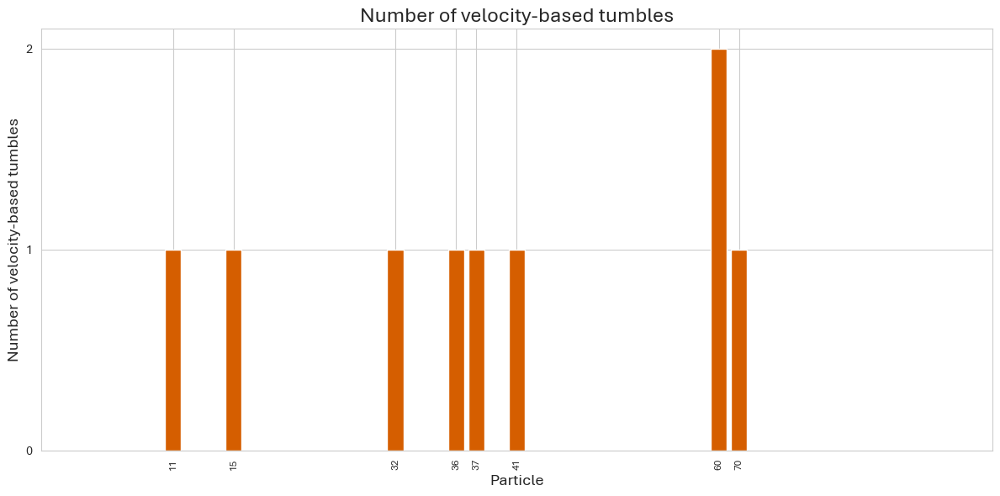

(<Figure size 1200x600 with 1 Axes>,
 <Axes: title={'center': 'Number of velocity-based tumbles'}, xlabel='Particle', ylabel='Number of velocity-based tumbles'>)

In [109]:
# Plot Number of Velocity-Based Tumbles per Particle
stats_advanced.plot_particle_velocity_tumble_metric(
    metric="number_of_tumbles",
    plot_style="bar", # "bar" or "polar"
    show_particle_ID=True,
    color='#D55E00', # Can also use colormaps
    figsize=(12,6)
    )


#### 7.5.2.2: Plot Velocity-Based Tumble Analysis per Selected Particle (Default = Highest Tumble Count)

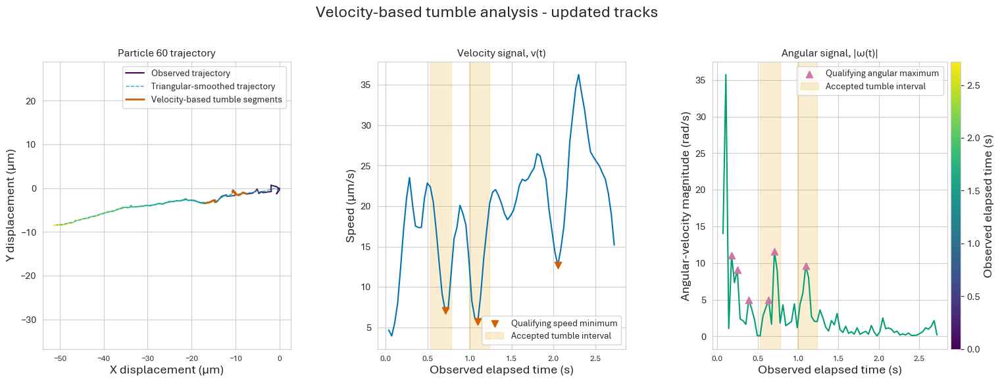

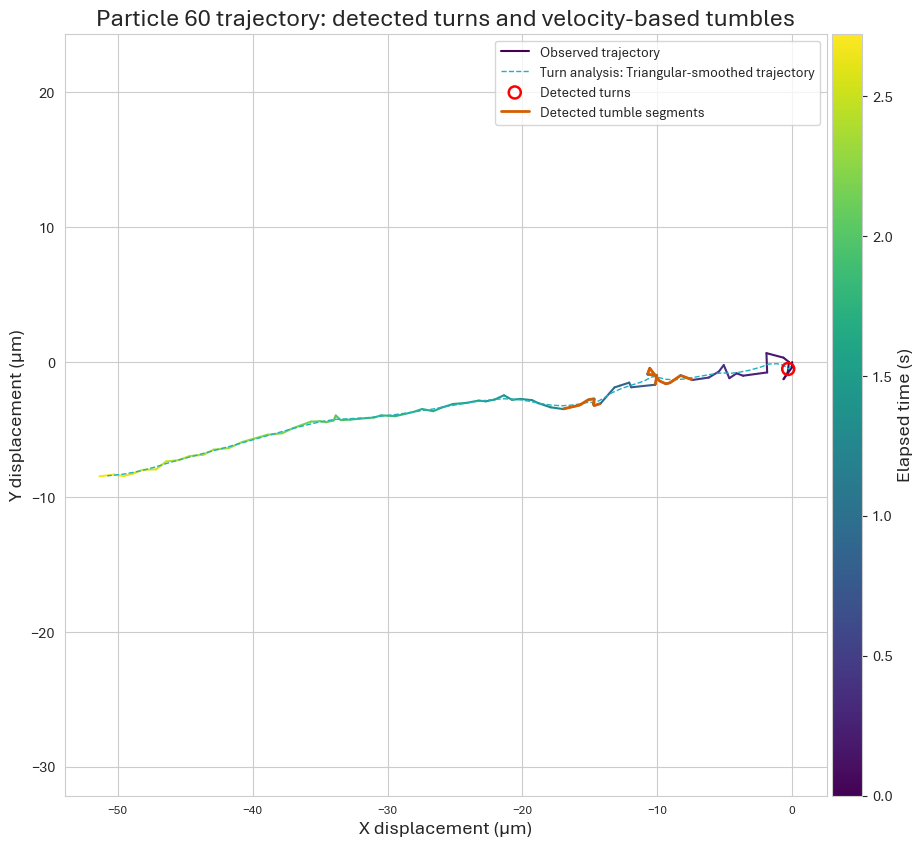

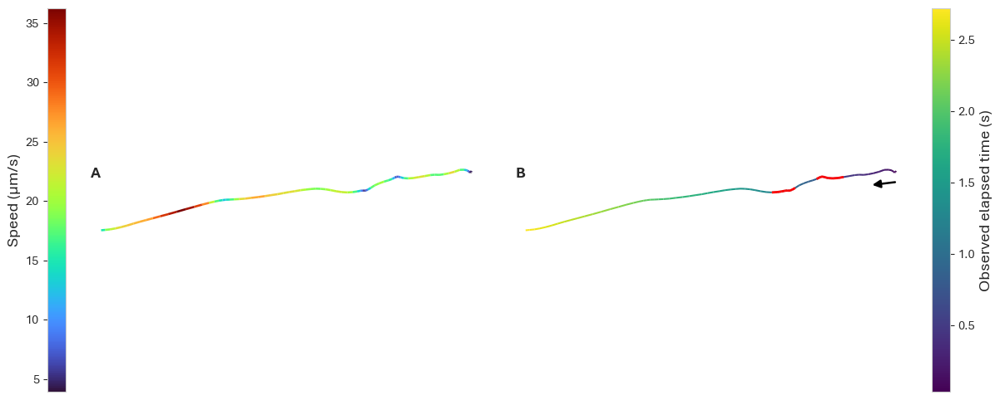

In [110]:
# Review the particle with the largest detected tumble count
particles_with_tumbles = velocity_tumble_summary_df.loc[velocity_tumble_summary_df["number_of_tumbles"] > 0]

if not particles_with_tumbles.empty:
    particle_to_review = int(particles_with_tumbles.nlargest(1, "number_of_tumbles")["particle"].iloc[0])

    # Plot Velocity-Based Tumble Analysis for a Selected Particle (Default = Highest Turn Count)
    stats_advanced.plot_particle_velocity_tumble_analysis(
        particle_id=particle_to_review,
        tumble_display_mode="segments"
        )

    # Plot Combined Turn and Velocity-Based Tumble Analysis and Figure-5-Style Comparison for a Selected Particle (Default = Highest Turn Count)
    stats_advanced.plot_particle_turn_velocity_tumble_analysis(
        particle_id=particle_to_review,
        tumble_display_mode="segments",

        # Velocity Plot Settings
        speed_colormap_name="turbo",
        comparison_track_color="viridis",  # Elapsed-time colormap; use "0.55" for a uniform track
        comparison_tumble_color="red",
        direction_arrow_color="black",
        show_direction_arrow=True,
        show_comparison_axes=False,
        )
else:
    particle_to_review = None
    print("No particles have more than 0 tumbles.")


#### 7.5.2.3: Plot Velocity-Based Tumble Analysis per Selected Particle (All Tumble Positive Tracks)

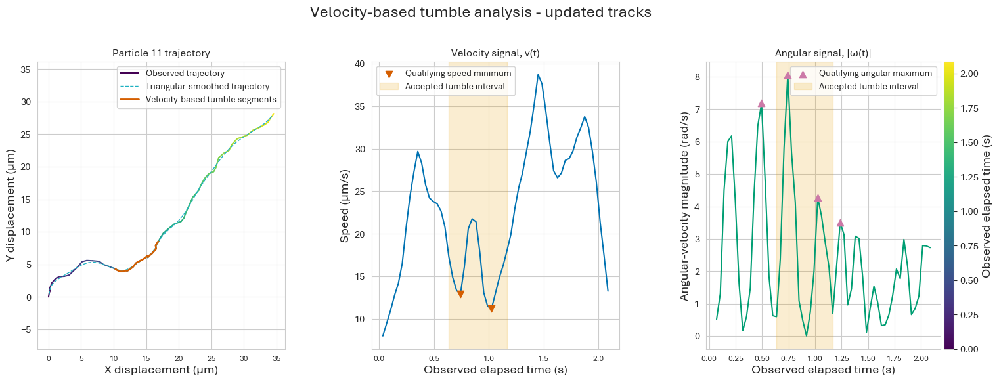

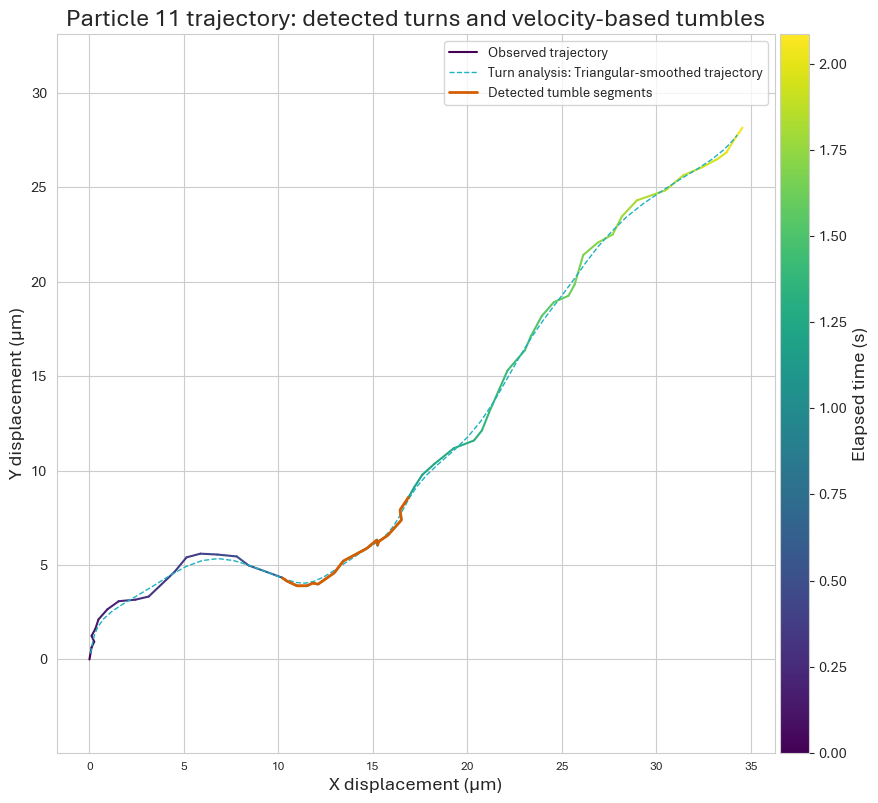

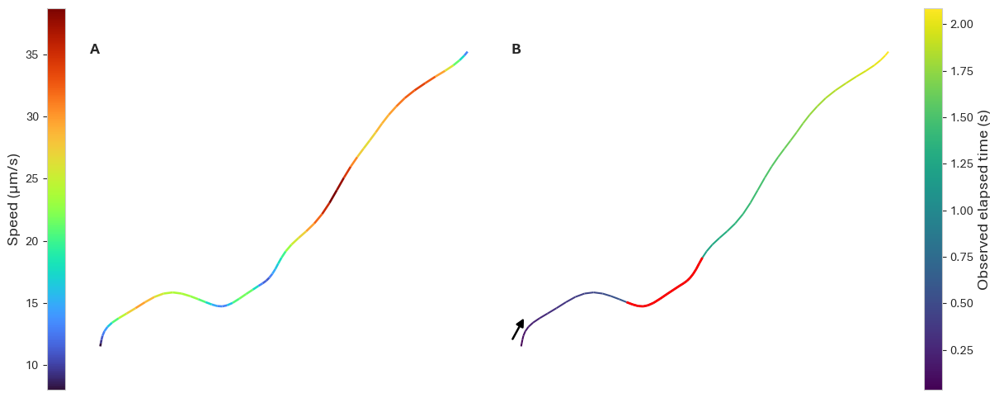

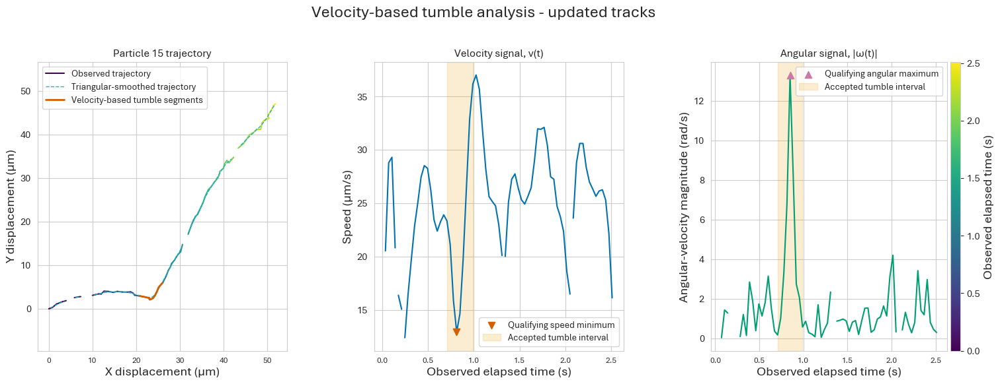

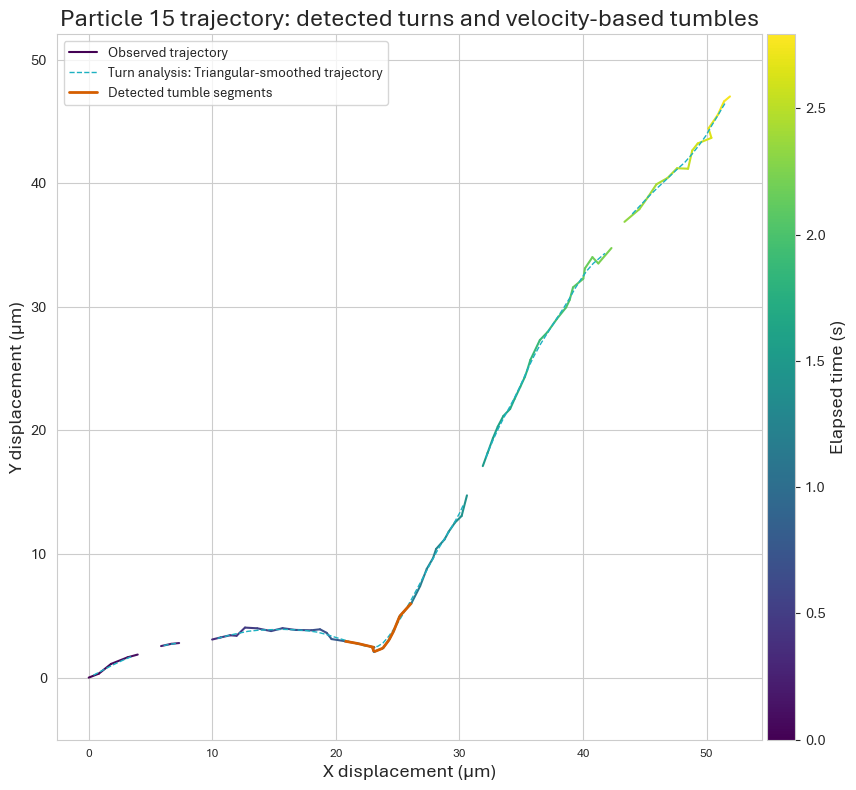

...

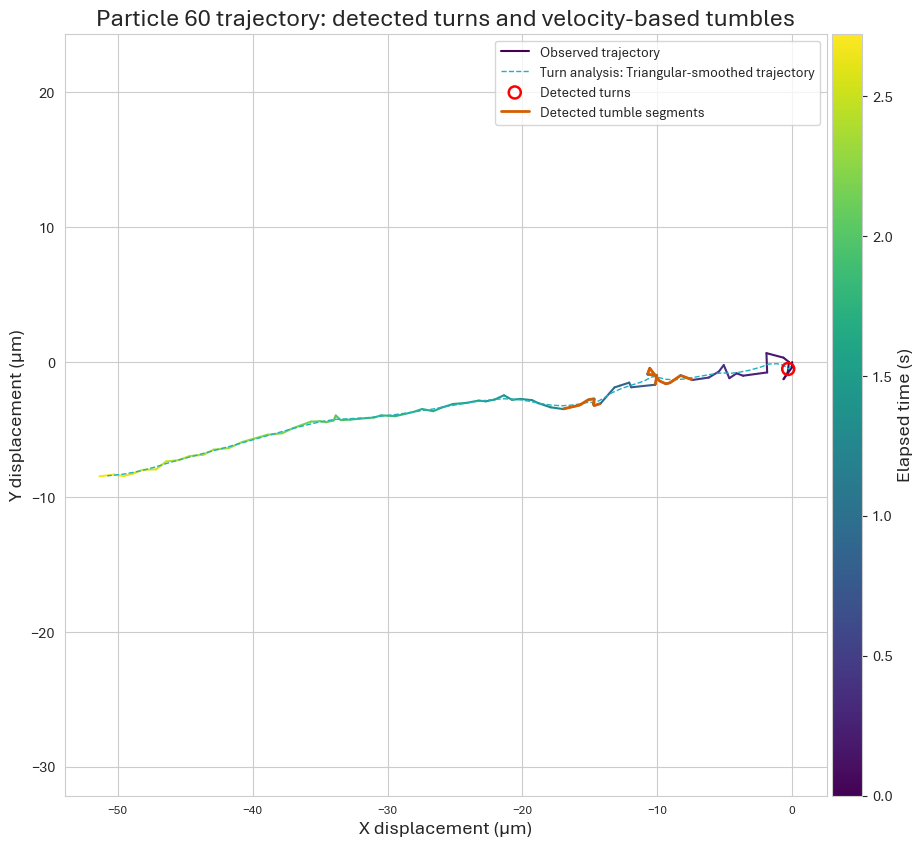

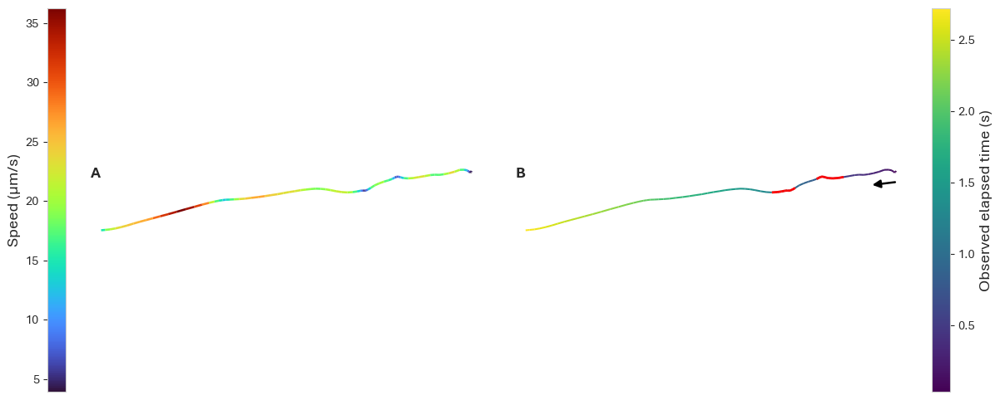

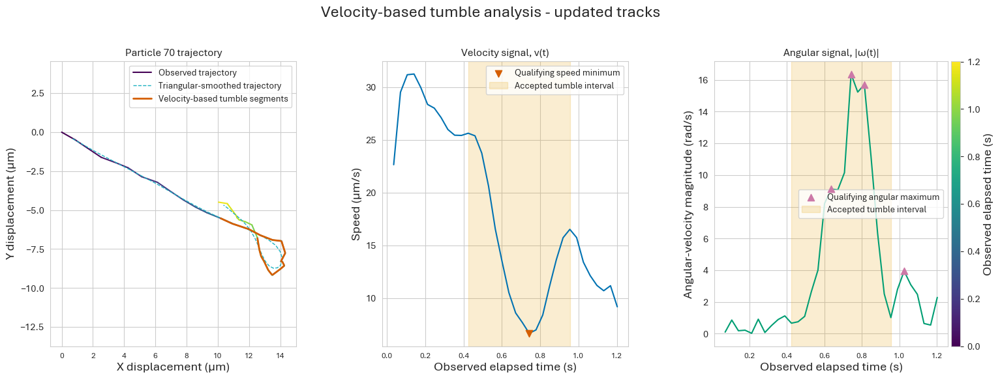

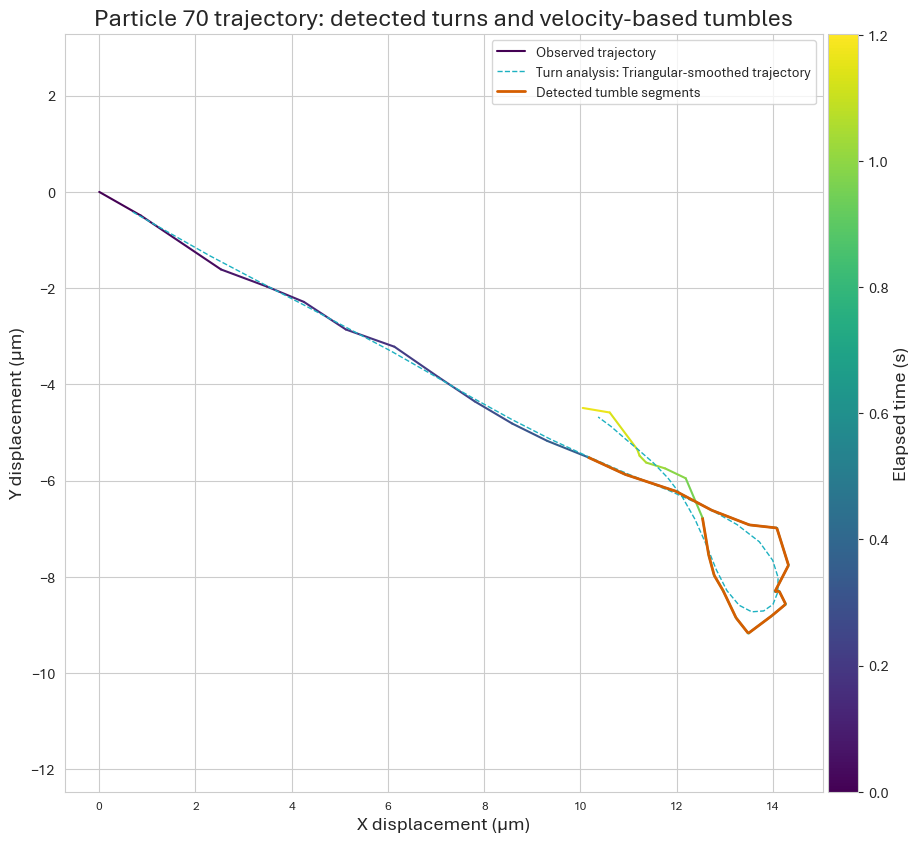

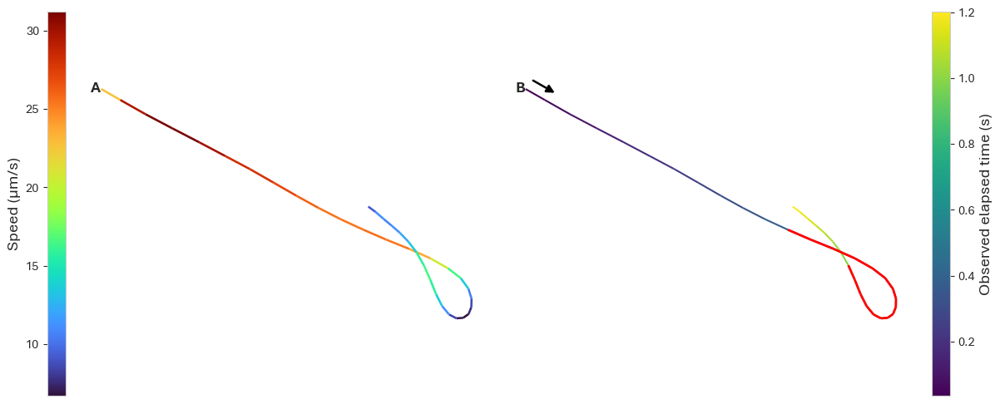

In [111]:
# Plot Velocity-Based Turn Analysis & Combine Turn and Velocity-Based Tumble Analysis for All Tumble Positive Available Particles
for particle_to_review in (velocity_tumble_summary_df.loc[velocity_tumble_summary_df["number_of_tumbles"] > 0,"particle",].dropna().unique()):
    # Plot Velocity-Based Tumble Analysis
    stats_advanced.plot_particle_velocity_tumble_analysis(
        particle_id=particle_to_review,
        tumble_display_mode="segments",
        )

    # Plot Combined Turn and Velocity-Based Tumble Analysis and Figure-5-Style Comparison
    stats_advanced.plot_particle_turn_velocity_tumble_analysis(
        particle_id=particle_to_review,
        tumble_display_mode="segments",

        # Velocity Plot Settings
        speed_colormap_name="turbo",
        comparison_track_color="viridis",  # Elapsed-time colormap; use "0.55" for a uniform track
        comparison_tumble_color="red",
        direction_arrow_color="black",
        show_direction_arrow=True,
        show_comparison_axes=False,
        )

## 7.6: Speed-feature correlation
This replaces the two overlapping area-speed examples from the upstream RABiTPy additional-examples notebooks. It sorts tracks by frame, divides motion by the actual frame difference, uses Capture FPS for per-second units, and converts area using the square of the pixel scale factor.

### 7.6.1: Area vs Speed

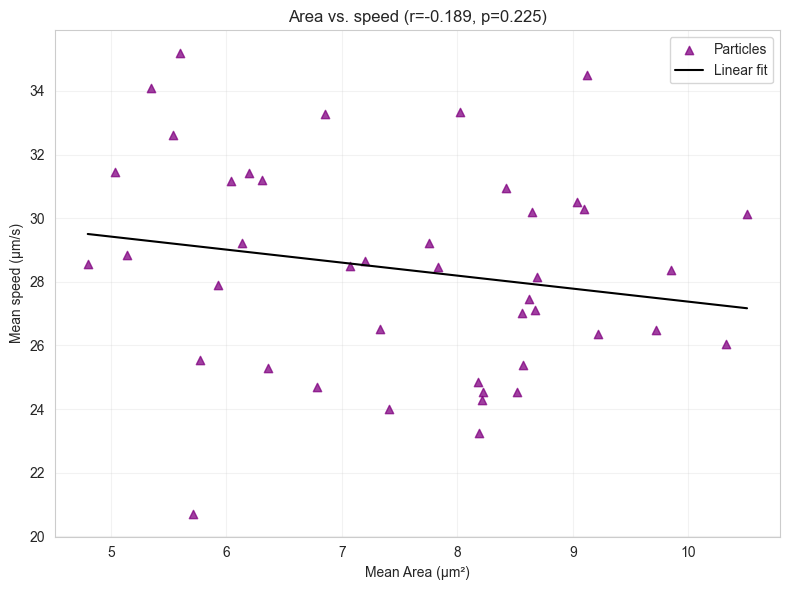

,strain,source_dataframe,feature_column,feature_unit,speed_unit,discard_initial_frames,discard_final_frames,particle_count,pearson_r,p_value,slope,intercept,r_squared,slope_standard_error
0,Strain_A,updated,area,um²,um/s,10,10,43,-0.188942,0.224965,-0.408907,31.466179,0.035699,0.331903


In [114]:
# Calculate Area vs Speed Correlation
area_speed_particles_df, area_speed_correlation_df = (
    stats_advanced.calculate_speed_feature_correlation(
        feature_column="area", # e.g. "area", "major_axis_length"
        feature_unit="scale_units",
        speed_unit="scale_units/s",
        particle_ids=None,  # None uses all particles; can also use a list of particle IDs
        max_frame_gap=1,
        discard_initial_frames=10,  # Remove detections in first 10-frame window
        discard_final_frames=10,  # Remove detections in final 10-frame window
        )
    )

# Plot Area vs Speed
stats_advanced.plot_speed_feature_correlation(
    particle_color="purple",
    linear_fit_color="black",
    particle_marker="^" # Supported markers include "o", "s", "^", "D", and "x"
)
display(area_speed_correlation_df)


## 7.7: Mean squared displacement and anomalous exponent

The alpha fit is performed only on positive, finite ensemble-MSD values in the requested lag-time range. Adjust `alpha_fit_lag_range` when comparing short-time and long-time motion regimes.

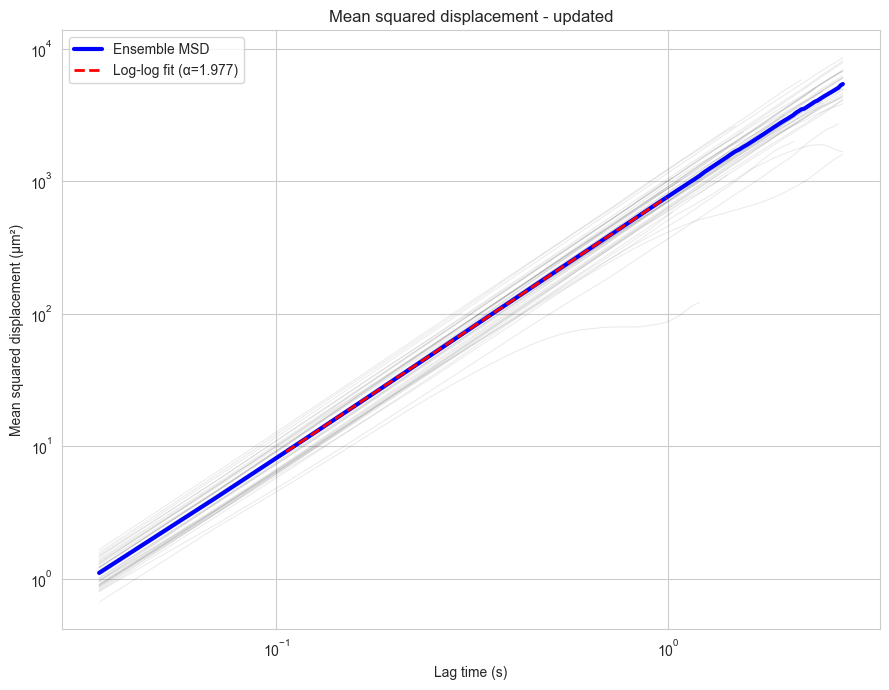

,strain,source_dataframe,particle_count,selected_particle_count,contributing_particle_count,max_lag_time_frames,discard_initial_frames,discard_final_frames,requested_alpha_fit_lag_start,requested_alpha_fit_lag_end,...,r_squared,p_value,alpha_standard_error,fit_status,fit_message,capture_speed_in_fps,pixel_scale_factor,scale_units,time_unit,msd_unit
0,Strain_A,updated,43,43,43,300,10,10,0.1,1.0,...,0.999998,4.285581e-71,0.000509,fitted,,28.278889,0.1625,um,s,um²


In [115]:
# Calculate MSD
individual_msd_df, ensemble_msd_df, msd_fit_df = (
    stats_advanced.calculate_mean_squared_displacement(
        max_lag_time_frames=300,
        distance_unit="scale_units",
        time_unit="seconds",
        alpha_fit_lag_range=(0.1, 1.0),
        discard_initial_frames=10,  # Remove detections in first 10-frame window
        discard_final_frames=10,  # Remove detections in final 10-frame window
        )
    )

# Plot MSD
stats_advanced.plot_mean_squared_displacement(
    show_individual=True,
    ensemble_msd_color="blue",
    log_log_fit_color="red",
    )
display(msd_fit_df)


## 7.8: Analysis Export

In [116]:
# Save Additional Analysis
save_additional_stats = True
additional_stats_path = Path("./02_Outputs/06_Additional_Analysis")

if save_additional_stats:
    additional_stats_path.mkdir(parents=True, exist_ok=True)
    particle_characteristics_df.to_csv(
        additional_stats_path / "01_Particle_Characteristics.csv", index=False)
    turn_summary_df.to_csv(
        additional_stats_path / "02_Turn_Summary.csv", index=False)
    turn_angles_df.to_csv(
        additional_stats_path / "03_Turn_Angles.csv", index=False)
    angle_tumble_summary_df.to_csv(
        additional_stats_path / "04_Angle_Tumble_Summary.csv", index=False)
    angle_tumble_events_df.to_csv(
        additional_stats_path / "05_Angle_Tumble_Events.csv", index=False)
    angle_tumble_points_df.to_csv(
        additional_stats_path / "06_Angle_Tumble_Points.csv", index=False)
    angle_tumble_population_df.to_csv(
        additional_stats_path / "07_Angle_Tumble_Population.csv", index=False)
    angle_tumble_table_1_df.to_csv(
        additional_stats_path / "07_Angle_Tumble_Table_1.csv", index=False)
    velocity_tumble_summary_df.to_csv(
        additional_stats_path / "08_Velocity_Tumble_Summary.csv", index=False)
    velocity_tumble_events_df.to_csv(
        additional_stats_path / "09_Velocity_Tumble_Events.csv", index=False)
    velocity_tumble_points_df.to_csv(
        additional_stats_path / "10_Velocity_Tumble_Points.csv", index=False)
    velocity_tumble_population_df.to_csv(
        additional_stats_path / "11_Velocity_Tumble_Population.csv", index=False)
    velocity_tumble_table_1_df.to_csv(
        additional_stats_path / "11_Velocity_Tumble_Table_1.csv", index=False)
    area_speed_particles_df.to_csv(
        additional_stats_path / "12_Area_Speed_Particles.csv", index=False)
    area_speed_correlation_df.to_csv(
        additional_stats_path / "13_Area_Speed_Correlation.csv", index=False)
    individual_msd_df.to_csv(
        additional_stats_path / "14_Individual_MSD.csv", index=False)
    ensemble_msd_df.to_csv(
        additional_stats_path / "15_Ensemble_MSD.csv", index=False)
    msd_fit_df.to_csv(
        additional_stats_path / "16_MSD_Fit.csv", index=False)
